#Nandi Higher Resolution Seed Recommendation

##Setup

In [ ]:
!pip install rasterio geopandas fiona requests

In [ ]:
from google.colab import drive
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import requests
import time
import rasterio
import os

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q shapely

##Shape files for counties and wards

In [ ]:
shp_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiWards/ward.results.formatted.shp'
wards_gdf = gpd.read_file(shp_path)

county_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
counties_gdf = gpd.read_file(county_path)

#Data Acquisition

###CropSuite Maize Data

General maize plant parameters are extracted from: https://github.com/flozabel/CropSuite/tree/main/plant_params/available. These include:

1. Growing Cycle
2. Temperature Ranges
3. Precipitation Ranges
4. Slope Ranges
5. Soil Depth Ranges (for long roots etc.) (iSDA)
6. Texture (iSDA)
7. CoarseFragments (Yes - NEED TO ADD stone_content)
8. pH (iSDA)
9. Organic Carbon (iSDA)
10. Base saturation - fertile vs infertile soil
11. Gypsum values % (Not covered)
12. Electrical Conductivity/ Salinity (Not covered)
13. Exchangeable Sodium Percentage (Not Covered)



### iSDA soil data

The following features of the iSDA soil dataset, at 30m resolution, are extracted: pH, Organic_Carbon, Total_Nitrogen, Phosphorus, Potassium, Calcium, Magnesium, Sulfur, Zinc, Aluminum, Iron, Clay_Content, Sand_Content, Texture_Class, Bulk_Density, Bedrock_Depth.



In [ ]:
import ee
import geopandas as gpd
import os

project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=project_id)

shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
output_folder = '01_Nandi_Seed_Recommender_System/Soil_Data'

gdf = gpd.read_file(shapefile_path)
nandi_gdf = gdf[gdf['COUNTY_NAM'] == 'NANDI']

if nandi_gdf.empty:
    raise ValueError("Error: Could not find 'NANDI' in column 'COUNTY_NAM'.")

full_geom = nandi_gdf.union_all()
nandi_roi = ee.Geometry(full_geom.__geo_interface__)

targets = {
    #"ph": "pH",
    "sodium_extractable": "Sodium",
    #"nitrogen_total": "Total_Nitrogen",
    #"carbon_organic": "Organic_Carbon",
    #"phosphorus_extractable": "Phosphorus",
    #"potassium_extractable": "Potassium",
    #"calcium_extractable": "Calcium",
    #"magnesium_extractable": "Magnesium",
    #"sulphur_extractable": "Sulfur",
    #"aluminium_extractable": "Aluminum",
    #"zinc_extractable": "Zinc",
    #"iron_extractable": "Iron",
    #"clay_content": "Clay_Content",
    #"sand_content": "Sand_Content",
    #"silt_content": "Silt_Content",
    #"texture_class": "Texture_Class",
    #"bulk_density": "Bulk_Density",
    #"bedrock_depth": "Bedrock_Depth"
}

for isda_name, file_name in targets.items():
    try:
        image = ee.Image(f"ISDASOIL/Africa/v1/{isda_name}")
        if "bedrock_depth" in isda_name:
            depths = [(0, "0-200cm")]
        else:
            # Band 0 is 0-20cm, Band 1 is 20-50cm
            depths = [(0, "0-20cm"), (1, "20-50cm")]

        for band_index, depth_suffix in depths:
            band = image.select(band_index)

            description_name = f"{file_name}_{depth_suffix}"

            task = ee.batch.Export.image.toDrive(
                image=band.clip(nandi_roi),
                description=description_name,
                folder=output_folder,
                region=nandi_roi,
                scale=30,
                crs='EPSG:4326',
                maxPixels=1e9
            )

            task.start()
            print(f"Submitted task: {description_name}")

    except Exception as e:
        print(f"Error submitting {file_name}: {e}")

print("Monitor progress at: https://code.earthengine.google.com/tasks")

Error submitting Sodium: Image.load: Image asset 'ISDASOIL/Africa/v1/sodium_extractable' not found (does not exist or caller does not have access).
Monitor progress at: https://code.earthengine.google.com/tasks


In [ ]:
import ee
import geopandas as gpd
import os

project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=project_id)

shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
output_folder = '01_Nandi_Seed_Recommender_System/Soil_Data'

gdf = gpd.read_file(shapefile_path)
nandi_gdf = gdf[gdf['COUNTY_NAM'] == 'NANDI']

if nandi_gdf.empty:
    raise ValueError("Error: Could not find 'NANDI' in column 'COUNTY_NAM'.")

full_geom = nandi_gdf.union_all()
nandi_roi = ee.Geometry(full_geom.__geo_interface__)

targets = {
    "stone_content": "stone_content",
    "cation_exchange_capacity": "cation_exchange_capacity"
}

for isda_name, file_name in targets.items():
    try:
        image = ee.Image(f"ISDASOIL/Africa/v1/{isda_name}")
        if "bedrock_depth" in isda_name:
            depths = [(0, "0-200cm")]
        else:
            # Band 0 is 0-20cm, Band 1 is 20-50cm
            depths = [(0, "0-20cm"), (1, "20-50cm")]

        for band_index, depth_suffix in depths:
            band = image.select(band_index)

            description_name = f"{file_name}_{depth_suffix}"

            task = ee.batch.Export.image.toDrive(
                image=band.clip(nandi_roi),
                description=description_name,
                folder=output_folder,
                region=nandi_roi,
                scale=30,
                crs='EPSG:4326',
                maxPixels=1e9
            )

            task.start()
            print(f"Submitted task: {description_name}")

    except Exception as e:
        print(f"Error submitting {file_name}: {e}")

print("Monitor progress at: https://code.earthengine.google.com/tasks")

Submitted task: stone_content_0-20cm
Submitted task: stone_content_20-50cm
Submitted task: cation_exchange_capacity_0-20cm
Submitted task: cation_exchange_capacity_20-50cm
Monitor progress at: https://code.earthengine.google.com/tasks


###Slope Data (NASA SRTM, 30m resolution)

In [ ]:
#Slope
import ee
import geopandas as gpd
import os

project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=project_id)

shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
output_folder = '01_Nandi_Seed_Recommender_System/Soil_Data'

gdf = gpd.read_file(shapefile_path)
nandi_gdf = gdf[gdf['COUNTY_NAM'] == 'NANDI']
if nandi_gdf.empty:
    raise ValueError("Error: Could not find 'NANDI'.")

full_geom = nandi_gdf.union_all()
nandi_roi = ee.Geometry(full_geom.__geo_interface__)

elevation = ee.Image("USGS/SRTMGL1_003")
slope = ee.Terrain.slope(elevation) # Calculates slope in Degrees

task = ee.batch.Export.image.toDrive(
    image=slope.clip(nandi_roi),
    description="Slope_Degrees",
    folder=output_folder,
    region=nandi_roi,
    scale=30,
    crs='EPSG:4326',
    maxPixels=1e9
)

task.start()
print("Monitor progress at: https://code.earthengine.google.com/tasks")

Processing shapefile...
Calculating Slope from Elevation data...
Monitor progress at: https://code.earthengine.google.com/tasks


In [ ]:
#elevation
import ee
import geopandas as gpd

# 1. Initialize Earth Engine
project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=project_id)

# 2. Define the Region of Interest (Nandi)
shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
gdf = gpd.read_file(shapefile_path)
nandi_gdf = gdf[gdf['COUNTY_NAM'] == 'NANDI']
full_geom = nandi_gdf.union_all()
nandi_roi = ee.Geometry(full_geom.__geo_interface__)

# 3. Load SRTM Elevation Data
# This is the 30m Global Digital Elevation Model (DEM)
elevation = ee.Image("USGS/SRTMGL1_003")

# 4. Export Task
output_folder = '01_Nandi_Seed_Recommender_System/Soil_Data'

task_elev = ee.batch.Export.image.toDrive(
    image=elevation.clip(nandi_roi),
    description="Elevation_30m",
    folder=output_folder,
    region=nandi_roi,
    scale=30,      # Matches your Slope and Soil data resolution
    crs='EPSG:4326',
    maxPixels=1e9
)

# Start the export
task_elev.start()

print("Elevation export started.")
print("Check progress at: https://code.earthengine.google.com/tasks")

Elevation export started.
Check progress at: https://code.earthengine.google.com/tasks


###Weather Data (WorldClim)

In [ ]:
import ee
import geopandas as gpd
import os

# 1. Auth
project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=project_id)

# 2. Config
shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
output_folder = '01_Nandi_Seed_Recommender_System/Soil_Data'

# 3. Shapefile Processing
gdf = gpd.read_file(shapefile_path)
nandi_gdf = gdf[gdf['COUNTY_NAM'] == 'NANDI']
full_geom = nandi_gdf.union_all()
nandi_roi = ee.Geometry(full_geom.__geo_interface__)

print("Fetching WorldClim Climatology Data...")

# 4. Load WorldClim Monthly Collection
worldclim = ee.ImageCollection("WORLDCLIM/V1/MONTHLY")

# 5. Loop through 12 Months
months = {
    1: "Jan", 2: "Feb", 3: "Mar", 4: "Apr", 5: "May", 6: "Jun",
    7: "Jul", 8: "Aug", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dec"
}

for month_num, month_name in months.items():
    try:
        # Filter for the specific month
        # The 'month' property in WorldClim is 1-12
        image = worldclim.filter(ee.Filter.eq('month', month_num)).first()

        # --- PRECIPITATION (mm) ---
        # Band name is 'prec'
        prec = image.select('prec')

        task_prec = ee.batch.Export.image.toDrive(
            image=prec.clip(nandi_roi),
            description=f"Precipitation_{month_num:02d}_{month_name}",
            folder=output_folder,
            region=nandi_roi,
            scale=30, # Resample 1km weather pixels to 30m to match Soil
            crs='EPSG:4326',
            maxPixels=1e9
        )
        task_prec.start()
        print(f"Submitted: Precip {month_name}")

        # --- TEMPERATURE (Mean) ---
        # Band name is 'tavg' (Average Temperature)
        # IMPORTANT: WorldClim V1 uses 'tavg' * 10. We must divide by 10 later in Python,
        # OR we can do math here. Let's keep it raw to be safe and divide later.
        temp = image.select('tavg')

        task_temp = ee.batch.Export.image.toDrive(
            image=temp.clip(nandi_roi),
            description=f"Temperature_{month_num:02d}_{month_name}",
            folder=output_folder,
            region=nandi_roi,
            scale=30,
            crs='EPSG:4326',
            maxPixels=1e9
        )
        task_temp.start()
        print(f"Submitted: Temp {month_name}")

    except Exception as e:
        print(f"Error on month {month_name}: {e}")

print("Monitor progress at: https://code.earthengine.google.com/tasks")

Fetching WorldClim Climatology Data...
Submitted: Precip Jan
Submitted: Temp Jan
Submitted: Precip Feb
Submitted: Temp Feb
Submitted: Precip Mar
Submitted: Temp Mar
Submitted: Precip Apr
Submitted: Temp Apr
Submitted: Precip May
Submitted: Temp May
Submitted: Precip Jun
Submitted: Temp Jun
Submitted: Precip Jul
Submitted: Temp Jul
Submitted: Precip Aug
Submitted: Temp Aug
Submitted: Precip Sep
Submitted: Temp Sep
Submitted: Precip Oct
Submitted: Temp Oct
Submitted: Precip Nov
Submitted: Temp Nov
Submitted: Precip Dec
Submitted: Temp Dec
Monitor progress at: https://code.earthengine.google.com/tasks


Weather Data (CHIRPS), including Lethal Values (Max/Min)

###Suitability Scores

Using fuzzy logic and Liebig's law of the minimum based on CropSuite's approach, we extract maize suitability scores for 30x30m grids in Nandi, for the short and long rains season separately.

We assume that soil traits stay approximately constant over these periods, and so account only for temperature and precipitation variations.

In [ ]:
import numpy as np
import os
import rasterio

def get_layer_fixed(filename, divisor=1.0, mask_zeros=False):
    """
    Load data with specific zero-handling.
    mask_zeros=True: Use for pH, Depth, Carbon (where 0 is impossible/NoData)
    mask_zeros=False: Use for Slope, Stones (where 0 is a valid perfect score)
    """
    path = os.path.join(data_folder, filename)
    if not os.path.exists(path):
        print(f"Warning: {filename} not found.")
        return None

    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)

        # Apply the Nandi Shape Mask
        if VALID_MASK is not None:
            data[~VALID_MASK] = np.nan

        # Variable-specific masking
        if mask_zeros:
            data[data <= 0] = np.nan
        else:
            data[data < 0] = np.nan # Allow 0, mask only negative errors

        return data / divisor

In [ ]:
import os
import numpy as np
import rasterio
import geopandas as gpd
from rasterio.features import geometry_mask

data_folder = "/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Soil_Data"
county_shp_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'

VALID_MASK = None

try:
    if os.path.exists(county_shp_path):
        counties_gdf = gpd.read_file(county_shp_path)
        nandi_gdf = counties_gdf[counties_gdf['COUNTY_NAM'] == 'NANDI']

        # Use one of your rasters as a template for the pixel grid
        template_path = os.path.join(data_folder, "pH_0-20cm.tif")

        if os.path.exists(template_path):
            with rasterio.open(template_path) as src:
                VALID_MASK = geometry_mask(
                    geometries=nandi_gdf.geometry,
                    out_shape=src.shape,
                    transform=src.transform,
                    all_touched=True,
                    invert=True
                )
        else:
            print(f"Warning: Template file not found at {template_path}. Masking will be skipped.")
    else:
        print(f"Warning: County shapefile not found at {county_shp_path}")

except Exception as e:
    print(f"Warning: Could not create mask. {e}")


# --- 3. THE GENERAL FUNCTION ---
def get_layer_fixed(filename, divisor=1.0, mask_zeros=False):
    """
    Load data with specific zero-handling.
    mask_zeros=True: Use for pH, Depth, Carbon (where 0 is impossible/NoData)
    mask_zeros=False: Use for Slope, Stones (where 0 is a valid perfect score)
    """
    path = os.path.join(data_folder, filename)
    if not os.path.exists(path):
        print(f"Error: {filename} not found.")
        return None

    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)

        # 1. Apply Spatial Mask (Clip to Nandi)
        if VALID_MASK is not None:
            if data.shape == VALID_MASK.shape:
                data[~VALID_MASK] = np.nan
            else:
                print(f"Dimension mismatch: {filename} shape {data.shape} != Mask shape {VALID_MASK.shape}")

        # 2. Apply Value Masking
        if mask_zeros:
            data[data <= 0] = np.nan
        else:
            data[data < 0] = np.nan

        return data / divisor

def score_continuous(val_array, x_vals, y_suit):
    """Fuzzy logic scoring for continuous variables."""
    if val_array is None: return None
    # Interp handles the math, we preserve NaNs
    scores = np.interp(val_array, x_vals, y_suit)
    return scores

def score_categorical(val_array, cat_map):
    """Discrete scoring for texture classes."""
    if val_array is None: return None
    output = np.zeros_like(val_array, dtype=np.float32)
    for cat, score in cat_map.items():
        output[val_array == cat] = score
    return output

import matplotlib.pyplot as plt
import numpy as np

def plot_pair(raw_data, score_data, title, unit):
    """
    Visualizes the raw soil parameter alongside its calculated suitability score
    with statistical summaries in the titles.
    """
    if raw_data is None or score_data is None:
        print(f"Skipping plot for {title}: Data is missing.")
        return

    # Calculate Statistics (ignoring NaNs)
    raw_min = np.nanmin(raw_data)
    raw_max = np.nanmax(raw_data)
    raw_mean = np.nanmean(raw_data)

    score_mean = np.nanmean(score_data)

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # --- Plot 1: Raw Data ---
    im1 = axes[0].imshow(raw_data, cmap='viridis', interpolation='none')

    # Dynamic Title with Stats
    axes[0].set_title(
        f"Raw {title}\n"
        f"Range: {raw_min:.2f} - {raw_max:.2f} {unit} (Mean: {raw_mean:.2f})"
    )
    axes[0].axis('off')
    plt.colorbar(im1, ax=axes[0], label=unit, fraction=0.046, pad=0.04)

    # --- Plot 2: Suitability Score ---
    im2 = axes[1].imshow(score_data, cmap='RdYlGn', vmin=0, vmax=1, interpolation='none')

    # Dynamic Title with Mean Score
    axes[1].set_title(
        f"{title} Suitability\n"
        f"Mean Score: {score_mean:.2f}"
    )
    axes[1].axis('off')
    plt.colorbar(im2, ax=axes[1], label="Suitability Index (0-1)", fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


###Investigating pH suitability

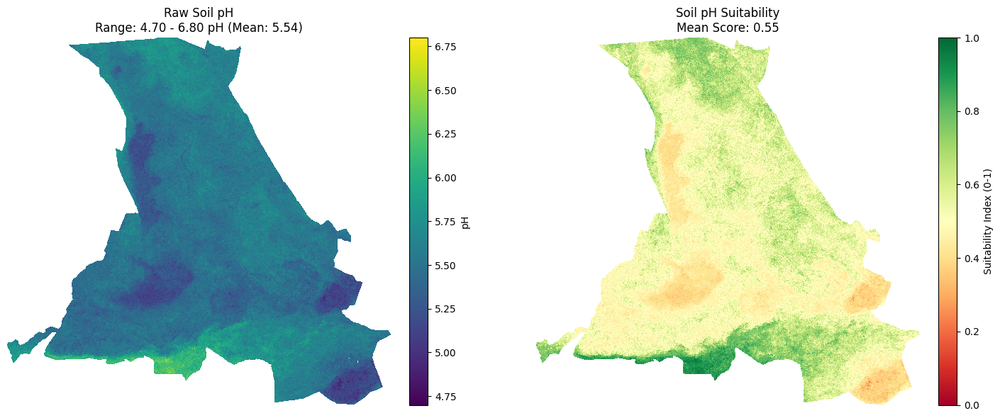

In [ ]:
# mask zeros because a pH of 0 is chemically impossible in soil.
raw_ph = get_layer_fixed("pH_0-20cm.tif", divisor=10.0, mask_zeros=True)

# From Cropsuite
ph_vals = [4.5, 5.0, 5.5, 5.8, 6.2, 6.6, 7.0, 7.8, 8.2, 8.5]
ph_suit = [0.0, 0.33, 0.5, 0.75, 0.92, 1.0, 0.92, 0.75, 0.33, 0.0]

score_ph = score_continuous(raw_ph, ph_vals, ph_suit)

plot_pair(raw_ph, score_ph, "Soil pH", "pH")

###Investigating Organic Carbon Suitability

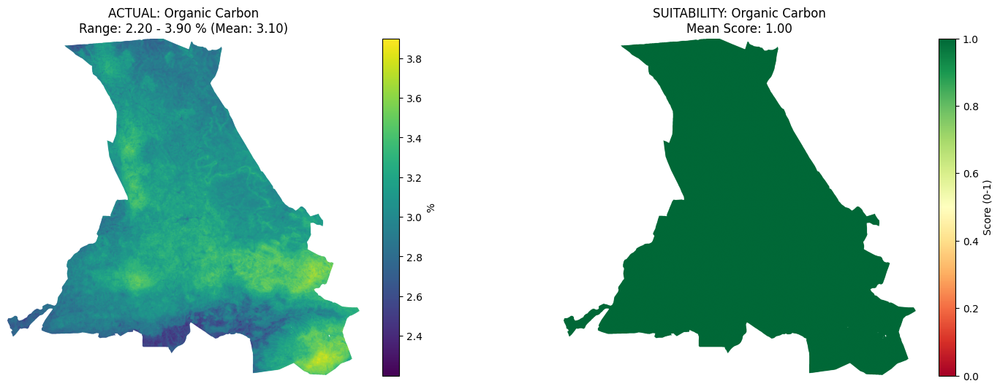

In [ ]:
# 1. Load Carbon
raw_carbon = get_layer_fixed("Organic_Carbon_0-20cm.tif", divisor=10.0, mask_zeros=True)

# 2. Define Maize Logic
carbon_vals = [0.0, 0.5, 0.8, 1.2, 2.0]
carbon_suit = [0.0, 0.33, 0.75, 0.92, 1.0]

# 3. Score
score_carbon = score_continuous(raw_carbon, carbon_vals, carbon_suit)

# Validation check
plot_pair(raw_carbon, score_carbon, "Organic Carbon", "%")

###Investigating Slope

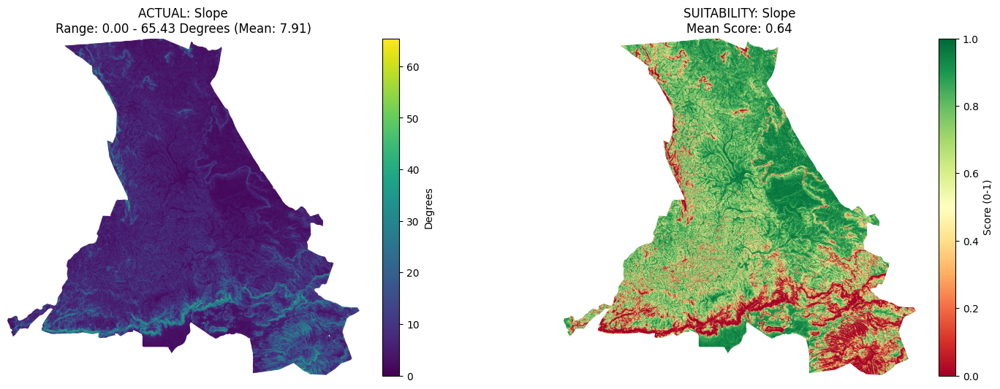

In [ ]:
# mask_zeros=False so we keep the perfect 0-degree flat land
raw_slope = get_layer_fixed("Slope_Degrees.tif", divisor=1.0, mask_zeros=False)

# 2. Define Maize Logic from your config
#slope_vals = [0.0, 2.0, 4.0, 6.0, 8.0]
#slope_suit = [1.0, 0.92, 0.75, 0.33, 0.0]

#Using FAO standards instead - countouring needed for 5.7, terracing needed for 10; 14+ is high risk
slope_vals = [0.0, 2.3, 5.7, 10.0, 14.0, 20.0]
slope_suit = [1.0, 0.95, 0.80, 0.45, 0.10, 0.0]

# 3. Score
score_slope = score_continuous(raw_slope, slope_vals, slope_suit)

# Validation check
plot_pair(raw_slope, score_slope, "Slope", "Degrees")

###Investigating Bedrock

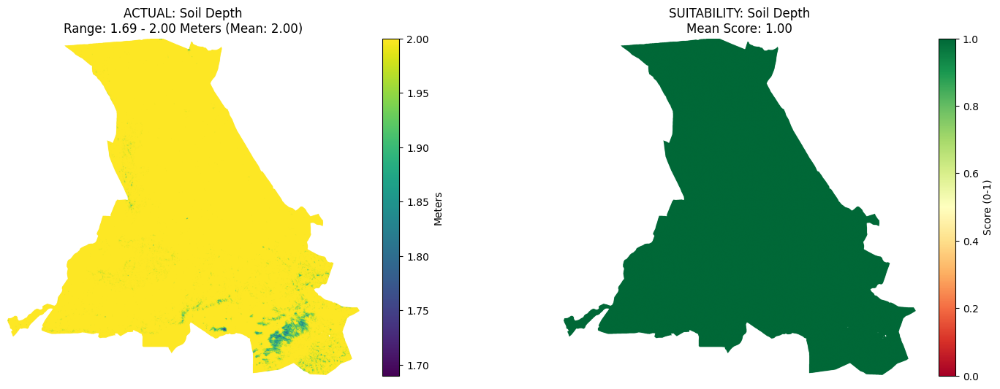

In [ ]:
# 1. Load Soil Depth (iSDA cm -> m)
raw_depth = get_layer_fixed("Bedrock_Depth_0-200cm.tif", divisor=100.0, mask_zeros=True)

# 2. Maize Config
depth_vals = [0.2, 1.0]
depth_suit = [0.0, 1.0]

# 3. Score
score_depth = score_continuous(raw_depth, depth_vals, depth_suit)

# Validation
plot_pair(raw_depth, score_depth, "Soil Depth", "Meters")

###Investigating Stone Content

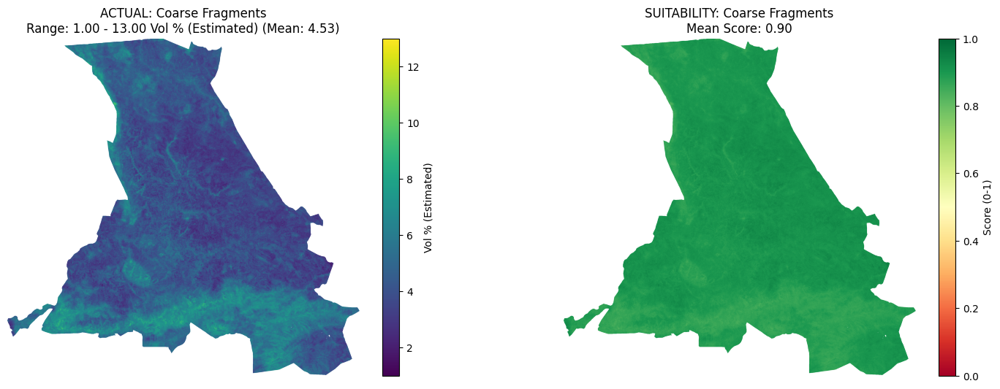

In [ ]:
mask_zeros=False because 0% stones is the ideal state
raw_stones = get_layer_fixed("stone_content_0-20cm.tif", divisor=2.0, mask_zeros=False)

# 2. Define Maize Logic from your config
stone_vals = [0.0, 3.0, 15.0, 35.0, 55.0]
stone_suit = [1.0, 0.92, 0.75, 0.33, 0.0]

# 3. Score
score_stones = score_continuous(raw_stones, stone_vals, stone_suit)

# Validation check
plot_pair(raw_stones, score_stones, "Coarse Fragments", "Vol % (Estimated)")

###Investigating Texture Class

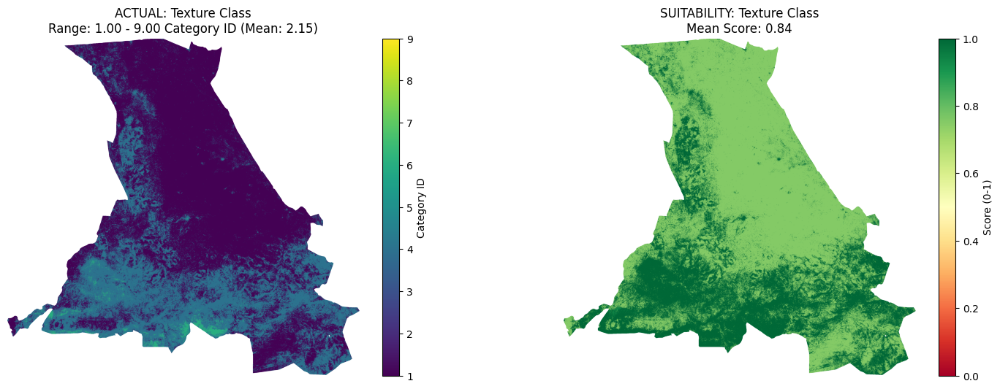

In [ ]:
# 1. Load Texture Class
# Divisor is 1.0 because these are Category IDs (Integers)
raw_texture = get_layer_fixed("Texture_Class_0-20cm.tif", divisor=1.0, mask_zeros=True)

# Adjusted due to mismatch between iSDA and CropSuite values
tex_rules = {
    1:  0.75, # Clay
    2:  0.75, # Silty Clay
    3:  0.92, # Sandy Clay
    4:  1.0,  # Clay Loam
    5:  1.0,  # Silty Clay Loam
    6:  1.0,  # Sandy Clay Loam
    7:  1.0,  # Loam
    8:  0.92, # Silt Loam
    9:  0.92, # Sandy Loam
    10: 0.92, # Silt
    11: 0.0,  # Loamy Sand (too porous)
    12: 0.0,  # Sand (too porous)
    13: 0.0   # Peat/Rock (unsuitable)
}
# 3. Score
score_texture = score_categorical(raw_texture, tex_rules)

# Validation check
plot_pair(raw_texture, score_texture, "Texture Class", "Category ID")

###Investigating Cation Exchange Capacity

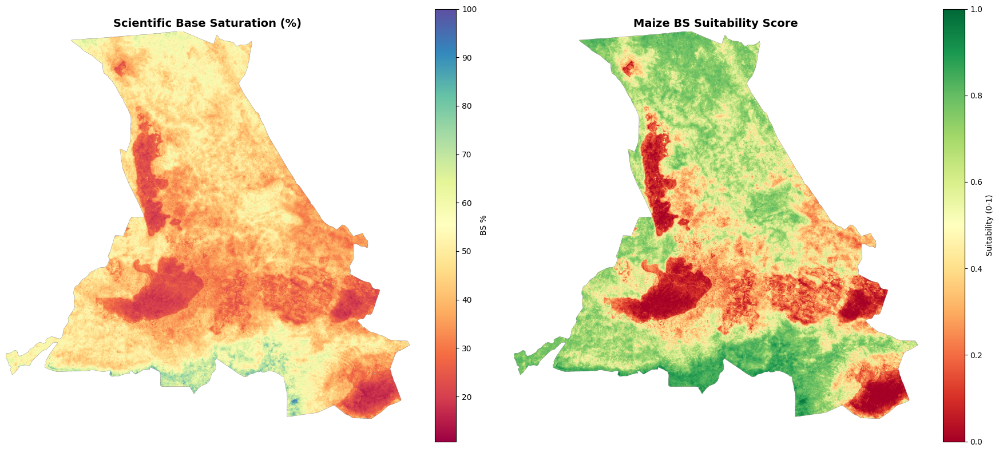

Mean Base Saturation: 42.18%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. LOAD iSDA LAYERS (0-20cm)
# We load the raw integer values directly first
ca_raw   = get_layer_fixed("Calcium_0-20cm.tif", divisor=1.0)
mg_raw   = get_layer_fixed("Magnesium_0-20cm.tif", divisor=1.0)
k_raw    = get_layer_fixed("Potassium_0-20cm.tif", divisor=1.0)
# mask_zeros=True helps, but we will apply a manual float mask for the plot
ecec_raw = get_layer_fixed("cation_exchange_capacity_0-20cm.tif", divisor=1.0, mask_zeros=True)

# 2. BACK-TRANSFORM iSDA LOG-DATA
# iSDA stores data as: ln(value + 1) * 10
ca_mg_kg = np.expm1(ca_raw / 10.0)
mg_mg_kg = np.expm1(mg_raw / 10.0)
k_mg_kg  = np.expm1(k_raw / 10.0)
ecec_cmol = np.expm1(ecec_raw / 10.0)

# 3. CONVERT mg/kg TO cmol(+)/kg (Charge Units)
# Constants based on atomic weights and valency
ca_cmol = ca_mg_kg / 200.4
mg_cmol = mg_mg_kg / 121.5
k_cmol  = k_raw / 391.0

# 4. CALCULATE BASE SATURATION
sum_bases_cmol = ca_cmol + mg_cmol + k_cmol
# Calculate percentage, using 'where' to avoid division by zero
base_sat = np.divide(sum_bases_cmol, ecec_cmol, out=np.zeros_like(ecec_cmol), where=ecec_cmol > 0) * 100

# 5. ALIGN WITH CROPSUITE STANDARDS
# Expert rule from Batjes (2016): Cap at 100%
base_sat = np.clip(base_sat, 0, 100)

# 6. CROPSUITE SUITABILITY SCORING
bs_vals = np.array([20.0, 35.0, 50.0, 80.0, 100.0])
bs_suit = np.array([0.0, 0.33, 0.75, 0.92, 1.0])
score_bs = score_continuous(base_sat, bs_vals, bs_suit)

# --- THE FIX FOR THE RED BACKGROUND ---
# Force to float and use ecec_raw to identify the "NoData" background
# This works because matplotlib does not color 'NaN' values
base_sat = base_sat.astype(float)
score_bs = score_bs.astype(float)

# Identify background pixels (where eCEC is 0 or invalid)
bg_mask = (ecec_raw <= 0) | np.isnan(ecec_raw)
base_sat[bg_mask] = np.nan
score_bs[bg_mask] = np.nan

# 7. VISUAL AUDIT
fig, ax = plt.subplots(1, 2, figsize=(18, 8))

# im1: Physical Base Saturation
im1 = ax[0].imshow(base_sat, cmap='Spectral')
ax[0].set_title("Scientific Base Saturation (%)", fontsize=14, fontweight='bold')
plt.colorbar(im1, ax=ax[0], label="BS %")

# im2: Suitability Score
im2 = ax[1].imshow(score_bs, cmap='RdYlGn', vmin=0, vmax=1)
ax[1].set_title("Maize BS Suitability Score", fontsize=14, fontweight='bold')
plt.colorbar(im2, ax=ax[1], label="Suitability (0-1)")

for a in ax: a.axis('off')
plt.tight_layout()
plt.show()

print(f"Mean Base Saturation: {np.nanmean(base_sat):.2f}%")

###Temperature

Plotting elevation first:

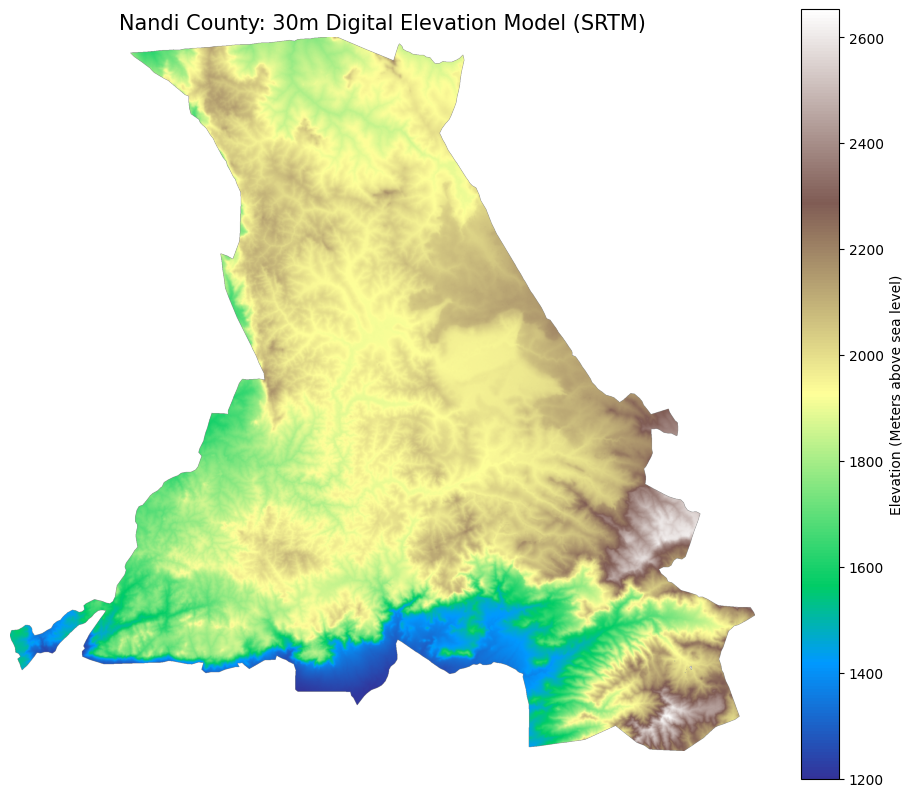

Minimum Elevation: 1199.00m
Maximum Elevation: 2653.00m
Mean Elevation: 1914.88m


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load only the 30m Elevation
raw_elevation = get_layer_fixed("Elevation_30m.tif", divisor=1.0, mask_zeros=True)

# Plotting the digital elevation model
plt.figure(figsize=(12, 10))
plt.imshow(raw_elevation, cmap='terrain')
plt.colorbar(label="Elevation (Meters above sea level)")
plt.title("Nandi County: 30m Digital Elevation Model (SRTM)", fontsize=15)
plt.axis('off')
plt.show()

# Print stats to verify the vertical range
print(f"Minimum Elevation: {np.nanmin(raw_elevation):.2f}m")
print(f"Maximum Elevation: {np.nanmax(raw_elevation):.2f}m")
print(f"Mean Elevation: {np.nanmean(raw_elevation):.2f}m")

Now we adjust temperature for elevation. CHIRPS assumes a single temperature for a large square, treating it as a plateau. So, we:
- Calculate spatial ratio between 11km ERA-5 temperature data and 30m elevation pixels
- Apply a Gaussian filter to temperature data to smooth grid cliffs
- Find average elevation of all 30m blocks to understand what ERA-5 was estimating upon; at the 30m resolution, subtracted that from actual 30m elevation to isolate 30x30 plots that deviated from this average.
- Multiply the altitude difference by $-0.0065^{\circ}\text{C}/\text{m}$ to calculate exactly how much colder or warmer each $30\text{m}$ pixel should be based on its height.
- Add back onto smoothed background.

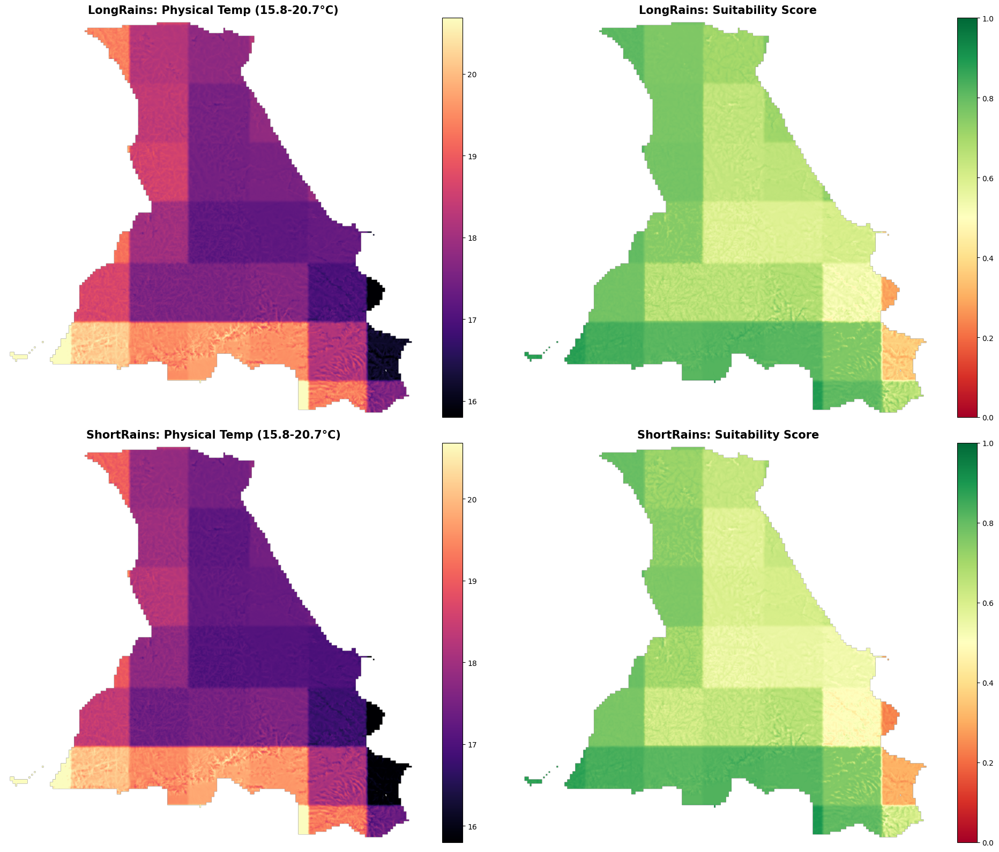

Seasonal Difference (Short - Long): -0.1906°C


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom, gaussian_filter

# 1. SETUP
t_vals = np.array([13.0, 14.0, 16.0, 18.0, 22.0, 24.0, 26.0, 32.0, 35.0, 40.0])
t_suit = np.array([0.0, 0.1, 0.33, 0.75, 0.92, 1.0, 0.92, 0.75, 0.33, 0.0])

seasons = ["LongRains", "ShortRains"]
base_path = "/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Soil_Data"

# We pre-calculate Global Min/Max to make the comparison honest
# If one season is 2 degrees warmer, the whole map should look brighter
all_temps = []

# First Pass: Load and calculate downscaled temps to find global scale
processed_data = {}

for season in seasons:
    file_name = f"Maize_Climate_Reliability_{season}_Calibrated_28Day.tif"
    temp_raw = get_stack_band(os.path.join(base_path, file_name), 2)

    # Physics (Same as before but consistent)
    elev_32 = raw_elevation.astype(np.float32)
    temp_32 = temp_raw.astype(np.float32)
    z_factors = [t/s for t, s in zip(elev_32.shape, temp_32.shape)]

    t_smooth = gaussian_filter(zoom(temp_32, z_factors, order=1), sigma=3)
    e_ref = gaussian_filter(zoom(zoom(elev_32, [1/z for z in z_factors], order=1), z_factors, order=1), sigma=3)

    t_30m = t_smooth + ((elev_32 - e_ref) * -0.0065)
    processed_data[season] = t_30m
    all_temps.append(t_30m)

# Determine global limits for a fair comparison
t_min, t_max = np.nanpercentile(np.array(all_temps), [1, 99])

# 2. PLOT
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

for i, season in enumerate(seasons):
    t_30m = processed_data[season]
    s_30m = score_continuous(t_30m, t_vals, t_suit)

    # Left: Physical Temp (Fixed Scale)
    im1 = axes[i, 0].imshow(t_30m, cmap='magma', vmin=t_min, vmax=t_max)
    axes[i, 0].set_title(f"{season}: Physical Temp ({t_min:.1f}-{t_max:.1f}°C)", fontsize=15, fontweight='bold')
    plt.colorbar(im1, ax=axes[i, 0], fraction=0.046, pad=0.04)

    # Right: Suitability (Fixed Scale 0-1)
    im2 = axes[i, 1].imshow(s_30m, cmap='RdYlGn', vmin=0, vmax=1)
    axes[i, 1].set_title(f"{season}: Suitability Score", fontsize=15, fontweight='bold')
    plt.colorbar(im2, ax=axes[i, 1], fraction=0.046, pad=0.04)

for ax in axes.flatten(): ax.axis('off')
plt.tight_layout()
plt.show()

# 3. VERIFICATION PRINT
diff = np.nanmean(processed_data["ShortRains"]) - np.nanmean(processed_data["LongRains"])
print(f"Seasonal Difference (Short - Long): {diff:.4f}°C")

###Precipitation

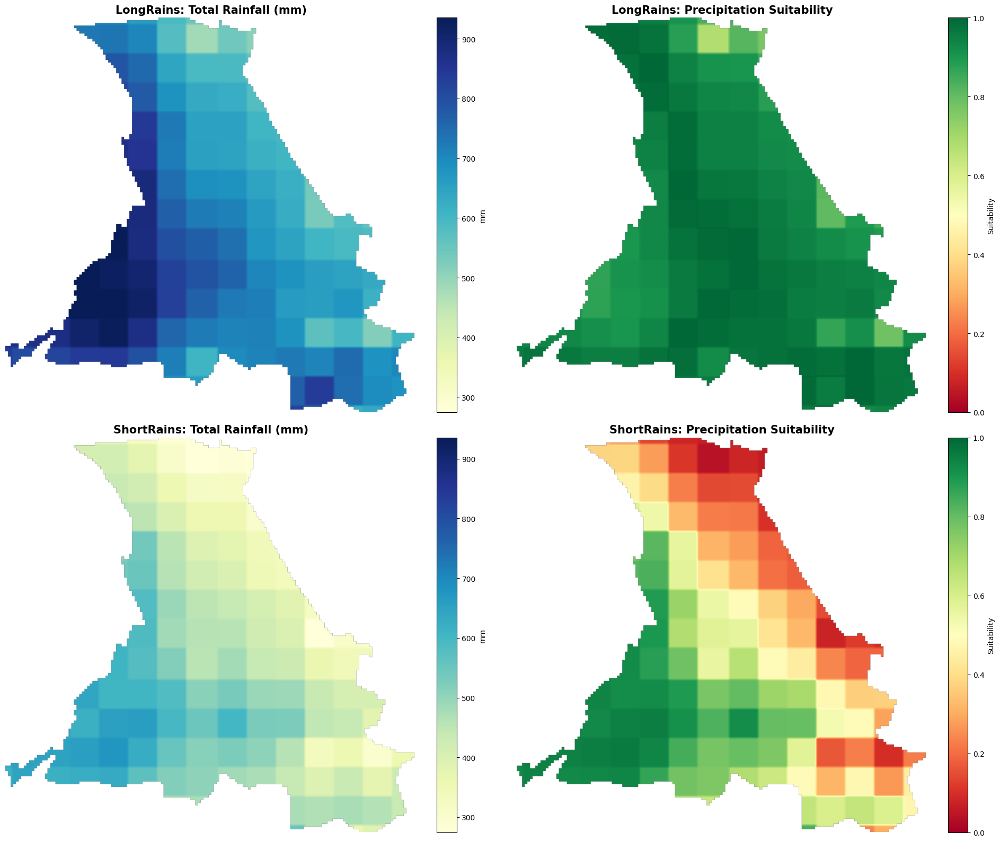

Long Rains are on average 256.24mm wetter than Short Rains.


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

# 1. PARAMETERS & CONFIG
p_vals = np.array([200.0, 300.0, 400.0, 500.0, 600.0, 750.0, 900.0, 1200.0, 1600.0, 2000.0])
p_suit = np.array([0.0, 0.1, 0.33, 0.75, 0.92, 1.0, 0.92, 0.75, 0.33, 0.3])

seasons = ["LongRains", "ShortRains"]
base_path = "/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Soil_Data"

# Pre-calculate global min/max for Precipitation to keep color scales honest
processed_precip = {}
all_precip_vals = []

for season in seasons:
    file_name = f"Maize_Climate_Reliability_{season}_Calibrated_28Day.tif"
    # Band 1 is total precipitation in your GEE stack
    precip_raw = get_stack_band(os.path.join(base_path, file_name), 1)

    # Upscale to 30m grid using Bilinear (order=1)
    # This aligns dimensions without adding "fake" Gaussian blur
    z_factors = [t/s for t, s in zip(raw_elevation.shape, precip_raw.shape)]
    precip_30m = zoom(precip_raw.astype(np.float32), z_factors, order=1)

    processed_precip[season] = precip_30m
    all_precip_vals.append(precip_30m)

# Fix color scale for rainfall (mm)
p_min, p_max = np.nanpercentile(np.array(all_precip_vals), [1, 99])

# 2. PLOT
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

for i, season in enumerate(seasons):
    p_30m = processed_precip[season]
    s_p_30m = score_continuous(p_30m, p_vals, p_suit)

    # Left: Physical Precipitation (mm)
    im1 = axes[i, 0].imshow(p_30m, cmap='YlGnBu', vmin=p_min, vmax=p_max)
    axes[i, 0].set_title(f"{season}: Total Rainfall (mm)", fontsize=15, fontweight='bold')
    plt.colorbar(im1, ax=axes[i, 0], label="mm", fraction=0.046, pad=0.04)

    # Right: Suitability (0-1)
    im2 = axes[i, 1].imshow(s_p_30m, cmap='RdYlGn', vmin=0, vmax=1)
    axes[i, 1].set_title(f"{season}: Precipitation Suitability", fontsize=15, fontweight='bold')
    plt.colorbar(im2, ax=axes[i, 1], label="Suitability", fraction=0.046, pad=0.04)

for ax in axes.flatten():
    ax.axis('off')

plt.tight_layout()
plt.show()

# Seasonal Audit
p_diff = np.nanmean(processed_precip["LongRains"]) - np.nanmean(processed_precip["ShortRains"])
print(f"Long Rains are on average {p_diff:.2f}mm wetter than Short Rains.")

###Overall Suitability

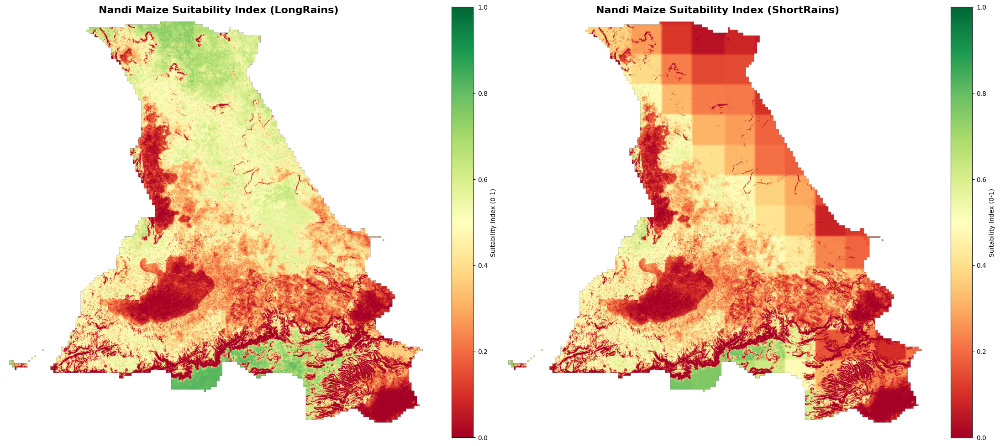

Mean Long Rains Continuous Suitability: 0.3636
Mean Short Rains Continuous Suitability: 0.2723


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. SOIL & TERRAIN PILLARS (Liebig's Law) ---
# Each pixel takes the value of the most limiting factor [cite: 99]
s_soil = np.minimum.reduce([
    score_ph,
    score_carbon,
    score_texture,
    score_bs,
    score_depth
])

# Terrain suitability considers slope and stones [cite: 98]
s_terrain = np.minimum(score_slope, score_stones)

# --- 2. SEASONAL AGGREGATION ---
final_maps_cont = {}

for season in ["LongRains", "ShortRains"]:
    # Climate components: Temperature and Precipitation [cite: 262]
    s_temp = score_continuous(processed_data[season], t_vals, t_suit)
    s_precip = score_continuous(processed_precip[season], p_vals, p_suit)

    # Climate suitability is the minimum of its components [cite: 265]
    s_climate = np.minimum(s_temp, s_precip)

    # Final Crop Suitability = Minimum of Climate and Soil/Terrain [cite: 100]
    # This reflects the core 'Law of the Minimum' assumption [cite: 20, 47]
    s_overall = np.minimum.reduce([s_climate, s_soil, s_terrain])

    # Apply background mask based on invalid ECEC or NaN values
    bg_mask = (ecec_raw <= 0) | np.isnan(ecec_raw)
    s_overall[bg_mask] = np.nan

    final_maps_cont[season] = s_overall

# --- 3. VISUALIZATION (Continuous Scale Only) ---
fig, axes = plt.subplots(1, 2, figsize=(22, 10))

for i, season in enumerate(["LongRains", "ShortRains"]):
    # Use the 'RdYlGn' colormap to represent suitability from 0 (Red) to 1 (Green)
    im = axes[i].imshow(final_maps_cont[season], cmap='RdYlGn', vmin=0, vmax=1)

    axes[i].set_title(f"Nandi Maize Suitability Index ({season})",
                      fontsize=16, fontweight='bold')

    # Add colorbar to explain the 0-1 suitability index
    plt.colorbar(im, ax=axes[i], label="Suitability Index (0-1)", fraction=0.046, pad=0.04)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Verification of results
print(f"Mean Long Rains Continuous Suitability: {np.nanmean(final_maps_cont['LongRains']):.4f}")
print(f"Mean Short Rains Continuous Suitability: {np.nanmean(final_maps_cont['ShortRains']):.4f}")

###Mapping Limiting Factors

/tmp/ipython-input-2789094176.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(labels))


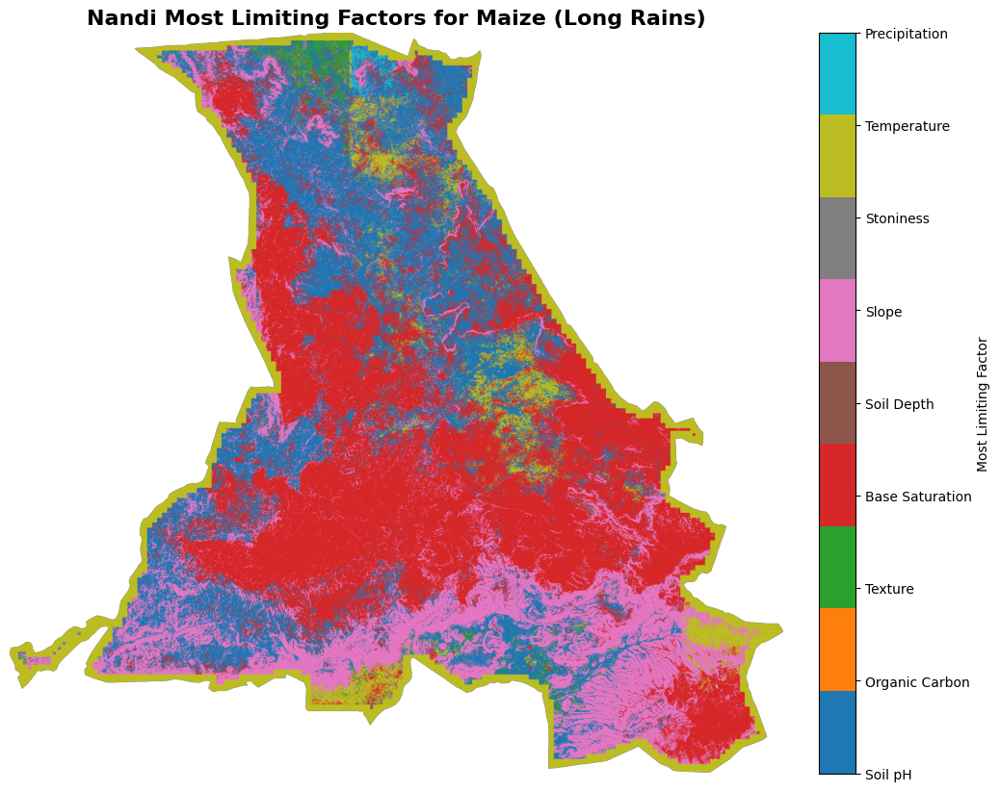

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def generate_limiting_factor_map(season):
    season_key = f"{season}Rains"

    # 1. Define the parameters to check
    # The order here determines priority if scores are tied [cite: 1105]
    factor_labels = [
        "Soil pH", "Organic Carbon", "Texture", "Base Saturation",
        "Soil Depth", "Slope", "Stoniness", "Temperature", "Precipitation"
    ]

    # 2. Gather all individual suitability scores
    s_temp = score_continuous(processed_data[season_key], t_vals, t_suit)
    s_precip = score_continuous(processed_precip[season_key], p_vals, p_suit)

    stack = np.stack([
        score_ph, score_carbon, score_texture, score_bs,
        score_depth, score_slope, score_stones, s_temp, s_precip
    ])

    # 3. Identify the index of the minimum score for each pixel [cite: 99, 100]
    # This identifies the "Most Limiting Factor"
    limiting_idx = np.argmin(stack, axis=0).astype(float)

    # 4. Apply background mask
    bg_mask = (ecec_raw <= 0) | np.isnan(ecec_raw)
    limiting_idx[bg_mask] = np.nan

    return limiting_idx, factor_labels

# --- Execution and Plotting ---
season_to_plot = "Long" # Change to "Short" as needed
lim_map, labels = generate_limiting_factor_map(season_to_plot)

# Create a custom colormap for the number of factors
colors = plt.cm.get_cmap('tab10', len(labels))
custom_cmap = ListedColormap(colors.colors)

fig, ax = plt.subplots(figsize=(12, 10))
im = ax.imshow(lim_map, cmap=custom_cmap)

# Add Legend
cbar = plt.colorbar(im, ax=ax, ticks=range(len(labels)), fraction=0.046, pad=0.04)
cbar.ax.set_yticklabels(labels)
cbar.set_label("Most Limiting Factor")

ax.set_title(f"Nandi Most Limiting Factors for Maize ({season_to_plot} Rains)",
             fontsize=16, fontweight='bold')
ax.axis('off')
plt.show()

###Interactive Code

In [ ]:
import numpy as np
import rasterio
from rasterio.transform import rowcol

# 1. FIX THE SCORING FUNCTION
# This allows the function to handle both maps and single coordinate lookups
def score_continuous_robust(val, x_vals, y_suit):
    score = np.interp(val, x_vals, y_suit)
    if np.isnan(val):
        return np.nan
    return score

# 2. SETUP THE SPATIAL REFERENCE
with rasterio.open("/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Soil_Data/Sulfur_0-20cm.tif") as src:
    nandi_transform = src.transform

def analyze_point_suitability():
    season_input = input("Enter Season (Long/Short): ").strip().lower()
    if season_input not in ['long', 'short']:
        print("Invalid season. Use 'Long' or 'Short'.")
        return

    try:
        lat = float(input("Enter Latitude: "))
        lon = float(input("Enter Longitude: "))
    except ValueError:
        print("Invalid coordinate format.")
        return

    season_key = "LongRains" if season_input == "long" else "ShortRains"

    # 3. Identify the Grid Cell indices
    row, col = rowcol(nandi_transform, lon, lat)

    # 4. Extract Suitability Scores
    # We use the robust scoring function to avoid the TypeError
    s_temp = score_continuous_robust(processed_data[season_key][row, col], t_vals, t_suit)
    s_precip = score_continuous_robust(processed_precip[season_key][row, col], p_vals, p_suit)

    # Dictionary of all factors using Liebig's Law [cite: 99, 100]
    all_factors = {
        "Soil pH": score_ph[row, col],
        "Organic Carbon": score_carbon[row, col],
        "Soil Texture": score_texture[row, col],
        "Base Saturation": score_bs[row, col],
        "Soil Depth": score_depth[row, col],
        "Slope": score_slope[row, col],
        "Stoniness": score_stones[row, col],
        "Temperature": s_temp,
        "Precipitation": s_precip
    }

    # 5. Sort by limiting factor (lowest suitability first)
    sorted_factors = sorted(all_factors.items(), key=lambda item: item[1])
    overall_suitability = sorted_factors[0][1] # Overall is the minimum [cite: 100]

    print(f" For coordinates {lat}, {lon}")
    print(f" Season {season_key.upper()} | Overall Suitability {overall_suitability:.4f}")
    print("\n")
    print("The three most signficant limiting factors for maize yield at your location are:")

    for i in range(3):
        name, score = sorted_factors[i]
        print(f"{i+1}. {name:<20} | Suitability Score: {score:.4f}")


analyze_point_suitability()

Enter Season (Long/Short): Long
Enter Latitude: 0.1
Enter Longitude: 34.9
 For coordinates 0.1, 34.9
 Season LONGRAINS | Overall Suitability 0.4815


The three most signficant limiting factors for maize yield at your location are:
1. Base Saturation      | Suitability Score: 0.4815
2. Soil pH              | Suitability Score: 0.5833
3. Temperature          | Suitability Score: 0.7745


To do:
- Specific Seed Recommendation: Using the main limiting factors (e.g. temperature) + KenyaSeedCompany data (which includes elevation), we can suggest a seed (e.g. meant for higher elevation, pH etc.)
- Fertiliser Recommendation: N, P, etc. if base saturation is a limiting factor, and within that (but I need to separate base saturation into K, N, etc. first)
- Climate shocks - drought resistance etc.

Inclusion:
- Uncertainty in soil data

Yield Prediction:
- There is some yield data (about 900 data points) available at 30m resolution from GROWAfrica (mainly from OneAcreFund data). Seed data also includes expected yield - this could be incorporated as a prior to help a Random Forest model predict yield based on the soil and temperature data at that coordinate. We could then, depending on the quality of the model, suggest estimated improvements in yield using a given type of fertiliser etc.

Average Failure Frequency in Nandi: 4.89%
Max Failure Rate found: 20.00%


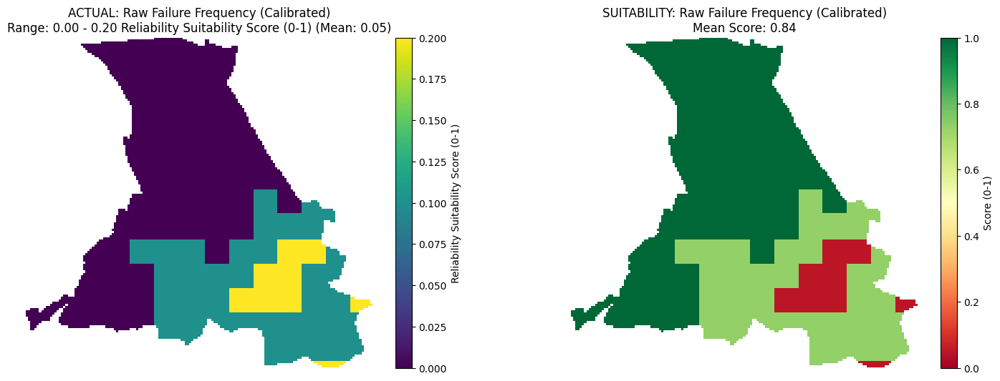

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load 10-Year Bands
file_path = "Maize_Climate_Reliability_LongRains_Calibrated_28Day.tif"

mean_precip_10y = get_stack_band(file_path, 1)
mean_temp_10y   = get_stack_band(file_path, 2)
fail_freq_10y   = get_stack_band(file_path, 3)

# 2. Apply the CropSuite Config Scoring
# This converts the 0-20% failure frequency into a 0.0-1.0 suitability score
fail_vals = [0.0, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.225, 0.25]
fail_suit = [1.0, 0.98, 0.95, 0.88, 0.73, 0.5, 0.27, 0.12, 0.05, 0.02, 0.0]

reliability_score = score_continuous(fail_freq_10y, fail_vals, fail_suit)

# 3. Stats Check
valid_mask = np.isfinite(fail_freq_10y)
avg_fail_rate = np.mean(fail_freq_10y[valid_mask])
print(f"Average Failure Frequency in Nandi: {avg_fail_rate*100:.2f}%")
print(f"Max Failure Rate found: {np.nanmax(fail_freq_10y)*100:.2f}%")

# 4. Plot (Side-by-Side)
plot_pair(
    fail_freq_10y,
    reliability_score,
    "Raw Failure Frequency (Calibrated)",
    "Reliability Suitability Score (0-1)"
)

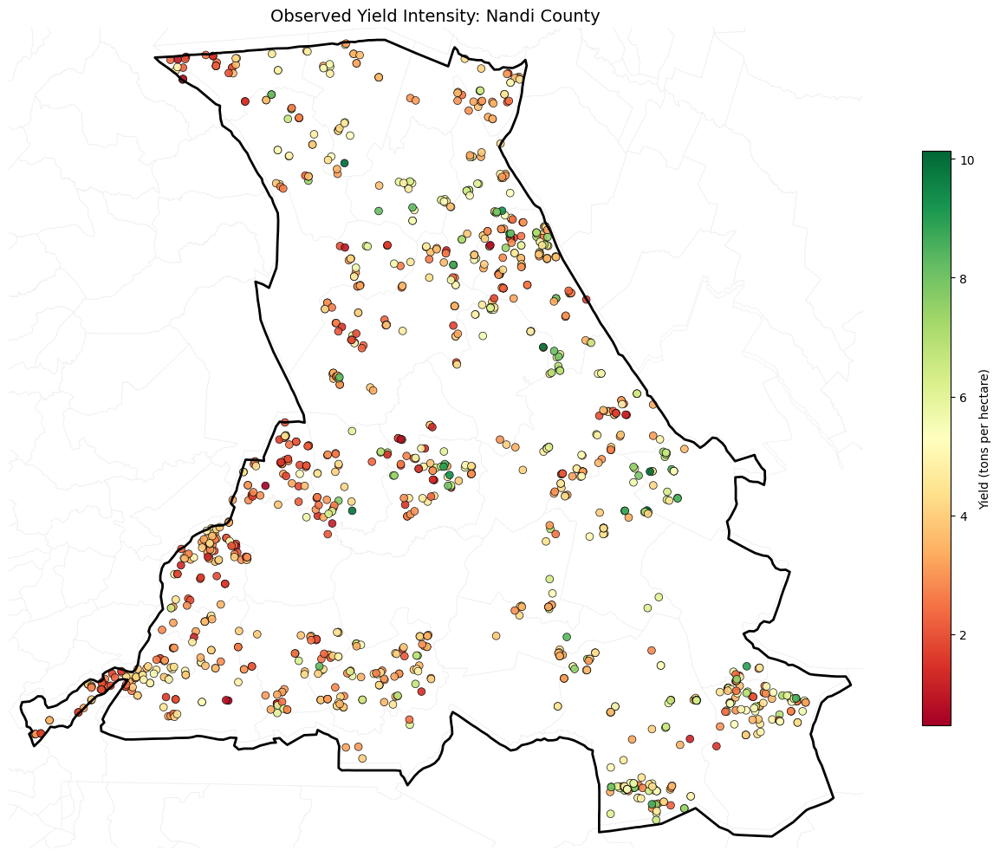

count    1218.000000
mean        4.059163
std         1.769958
min         0.465266
25%         2.822845
50%         3.824958
75%         5.116237
max        10.131305
Name: Yield_ton_ha_, dtype: float64


In [ ]:
# @title Yield Analysis and CSV Export
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import os

yield_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/GROW-Africa_Point.xlsx'
ward_shp = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiWards/ward.results.formatted.shp'
county_shp = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
output_csv_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Only_Yield_Data.csv'

wards_gdf = gpd.read_file(ward_shp).to_crs(epsg=4326)
counties_gdf = gpd.read_file(county_shp).to_crs(epsg=4326)

nandi_boundary = counties_gdf[counties_gdf['COUNTY_NAM'].str.contains('NANDI', case=False, na=False)]

df = pd.read_excel(yield_path)
lat_col = [c for c in df.columns if 'lat' in c.lower()][0]
lon_col = [c for c in df.columns if 'lon' in c.lower()][0]
yield_col = 'Yield_ton_ha_'

gdf_all = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[lon_col], df[lat_col]), crs="EPSG:4326")

nandi_points = gpd.sjoin(gdf_all, nandi_boundary, predicate='within')

if not nandi_points.empty:
    df_output = nandi_points.drop(columns=['geometry', 'index_right'])
    df_output.to_csv(output_csv_path, index=False)

fig, ax = plt.subplots(figsize=(14, 10))
wards_gdf.plot(ax=ax, color='white', edgecolor='#EEEEEE', linewidth=0.5)
nandi_boundary.boundary.plot(ax=ax, color='black', linewidth=2)

if not nandi_points.empty:
    nandi_points.plot(
        ax=ax,
        column=yield_col,
        cmap='RdYlGn',
        legend=True,
        markersize=40,
        alpha=0.9,
        edgecolor='black',
        linewidth=0.5,
        legend_kwds={'label': "Yield (tons per hectare)", 'orientation': "vertical", 'shrink': 0.7}
    )
    plt.title(f"Observed Yield Intensity: Nandi County", fontsize=14)

bounds = nandi_boundary.total_bounds
ax.set_xlim([bounds[0] - 0.01, bounds[2] + 0.01])
ax.set_ylim([bounds[1] - 0.01, bounds[3] + 0.01])
ax.set_axis_off()
plt.tight_layout()
plt.show()

if not nandi_points.empty:
    print(nandi_points[yield_col].describe())

--- Log-Transformed Final Results ---
Log-Space R-squared: 0.4212
Real-World MAE: 1.03 tons/ha


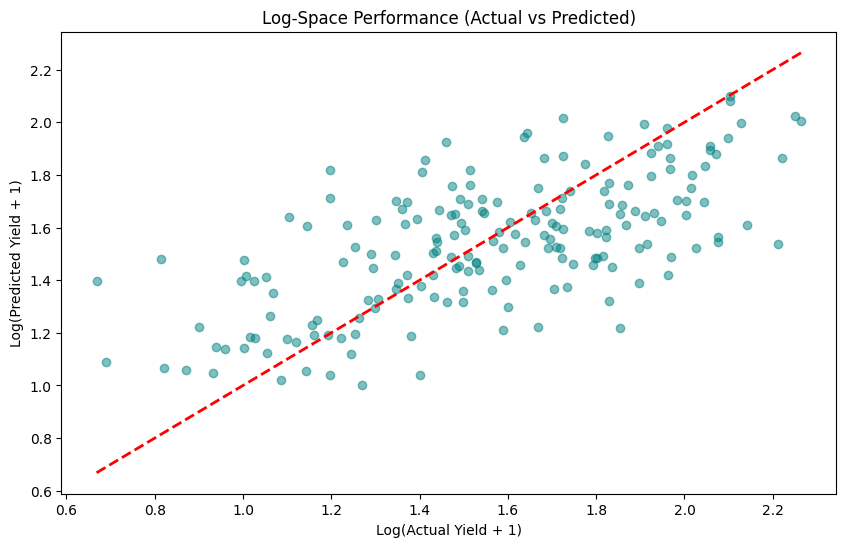

In [ ]:
# @title RF with refined feature set
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, mean_absolute_error

# 1. Use the 14 features identified by RFE
X_final_push = X_push[kept_features]

# 2. Log-Transform the target
y_log = np.log1p(y_eng)

# 3. Split
Xt_l, Xv_l, yt_l, yv_l = train_test_split(X_final_push, y_log, test_size=0.2, random_state=42)

# 4. Final Optimized XGBoost
final_model_log = xgb.XGBRegressor(
    n_estimators=1500,
    learning_rate=0.015,
    max_depth=6,
    subsample=0.85,
    colsample_bytree=0.85,
    random_state=42
)

final_model_log.fit(Xt_l, yt_l)

# 5. Evaluate (Note: we must transform back to original units for MAE)
y_pred_log = final_model_log.predict(Xv_l)
y_pred_orig = np.expm1(y_pred_log) # Reverse the log for real-world metrics
y_test_orig = np.expm1(yv_l)      # FIXED VARIABLE NAME HERE

r2_final_log = r2_score(yv_l, y_pred_log)
mae_final_orig = mean_absolute_error(y_test_orig, y_pred_orig)

print(f"--- Log-Transformed Final Results ---")
print(f"Log-Space R-squared: {r2_final_log:.4f}")
print(f"Real-World MAE: {mae_final_orig:.2f} tons/ha")

# 6. Final Visualization: Log-Space Residuals
plt.figure(figsize=(10, 6))
plt.scatter(yv_l, y_pred_log, alpha=0.5, color='teal')
plt.plot([yv_l.min(), yv_l.max()], [yv_l.min(), yv_l.max()], '--r', linewidth=2)
plt.title('Log-Space Performance (Actual vs Predicted)')
plt.xlabel('Log(Actual Yield + 1)')
plt.ylabel('Log(Predicted Yield + 1)')
plt.show()

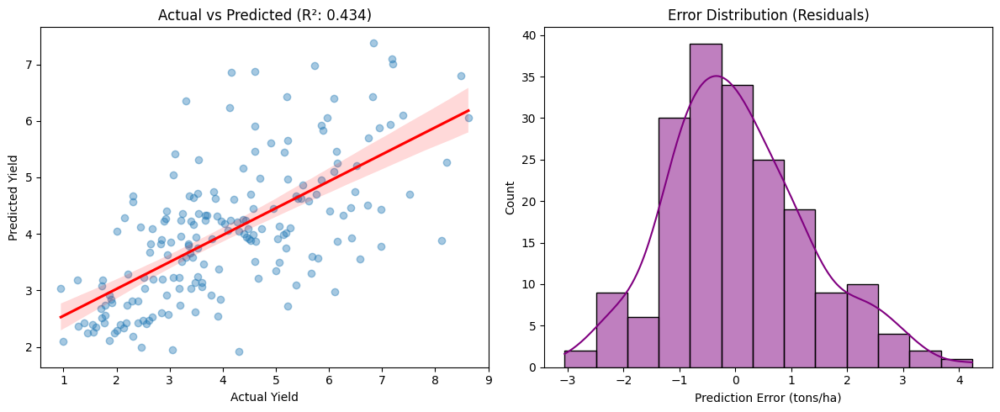

--- Top 10 Drivers (Spatial Model) ---
Spatial_Yield_Lag    0.243769
Iron_0-20cm          0.035224
Temp_Min             0.033360
Water_Retention      0.031507
Al_pH_Ratio          0.030121
Temp_Mean            0.029942
Rain_mm              0.029143
Temp_Max             0.028908
Slope_Deg            0.028828
Rainy_Days           0.028109
dtype: float32


In [ ]:
# @title Initial Feature Importance
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Generate Predictions
y_pred_adv = model_adv.predict(X_test_a)
residuals = y_test_a - y_pred_adv

# 2. Plot Actual vs Predicted
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.regplot(x=y_test_a, y=y_pred_adv, scatter_kws={'alpha':0.4}, line_kws={'color':'red'})
plt.title(f'Actual vs Predicted (R²: {r2_score(y_test_a, y_pred_adv):.3f})')
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')

# 3. Plot Residuals (Error Distribution)
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True, color='purple')
plt.title('Error Distribution (Residuals)')
plt.xlabel('Prediction Error (tons/ha)')

plt.tight_layout()
plt.show()

# 4. Check Feature Importance for the Spatial Model
adv_importances = pd.Series(model_adv.feature_importances_, index=final_features).sort_values(ascending=False)
print("--- Top 10 Drivers (Spatial Model) ---")
print(adv_importances.head(10))

#Extra testing

In [ ]:
import ee
import geopandas as gpd

# 1. Initialize
project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except:
    ee.Authenticate()
    ee.Initialize(project=project_id)

# 2. Geography
shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
gdf = gpd.read_file(shapefile_path)
nandi_roi = ee.Geometry(gdf[gdf['COUNTY_NAM'] == 'NANDI'].union_all().__geo_interface__)

# 3. Elevation Physics (30m)
srtm = ee.Image("USGS/SRTMGL1_003").clip(nandi_roi)

# Create the 11km baseline (matching ERA5-Land scale) to find the altitude deviation
elev_ref = srtm.resample('bilinear').reproject(
    crs='EPSG:4326',
    scale=11132
).resample('bicubic')

elev_delta = srtm.subtract(elev_ref)

def get_calibrated_30m_stack(start_month, start_day, label):
    years = ee.List.sequence(2015, 2024)

    def calculate_annual(year):
        year = ee.Number(year)
        start_date = ee.Date.fromYMD(year, start_month, start_day)
        end_date = start_date.advance(110, 'day')

        # Load Coarse Data
        precip_col = ee.ImageCollection("UCSB-CHG/CHIRPS/DAILY").filterDate(start_date, end_date)
        temp_col = ee.ImageCollection("ECMWF/ERA5_LAND/DAILY_AGGR").filterDate(start_date, end_date)

        # --- 30m PHYSICS INJECTION ---
        # Apply Lapse Rate (-0.0065 C/m) to every daily image
        def apply_lapse(img):
            t_base = img.select('temperature_2m').subtract(273.15)
            return t_base.add(elev_delta.multiply(-0.0065)).rename('t30')

        temp_30m = temp_col.map(apply_lapse)
        mean_t_30m = temp_30m.mean()

        # --- PHYSICAL FAILURE CHECKS ---
        # 1. Cold Failure (< 13.0C at 30m resolution)
        cold_fail = mean_t_30m.lt(13.0)

        # 2. 28-Day Drought (Regional)
        prec_list = precip_col.select('precipitation').toList(110)
        def check_drought(i):
            win = ee.ImageCollection(prec_list.slice(ee.Number(i), ee.Number(i).add(28)))
            return win.max().lt(1.0)

        drought_fail = ee.ImageCollection(ee.List.sequence(0, 110-28).map(check_drought)).max()

        survived = cold_fail.Or(drought_fail).Not().rename('survived')

        return ee.Image.cat([
            precip_col.select('precipitation').sum().rename('tp'),
            mean_t_30m.rename('mt'),
            survived
        ])

    ten_year_col = ee.ImageCollection(years.map(calculate_annual))

    # Final Aggregates
    final_stats = ten_year_col.mean()
    fail_freq = ee.Image(1).subtract(final_stats.select('survived')).rename('fail_freq')

    return ee.Image.cat([
        final_stats.select('tp').rename('mean_precip'),
        final_stats.select('mt').rename('mean_temp'),
        fail_freq
    ]).clip(nandi_roi)

# --- EXECUTION ---
seasons = [(3, 1, "LongRains_30m_Physical"), (10, 1, "ShortRains_30m_Physical")]

for month, day, label in seasons:
    stack = get_calibrated_30m_stack(month, day, label)

    task = ee.batch.Export.image.toDrive(
        image=stack.float(),
        description=f"Nandi_30m_Physical_{label}",
        folder="Soil_Data",
        region=nandi_roi,
        scale=30,  # CRITICAL: We export at 30m to capture the physics
        crs='EPSG:4326',
        maxPixels=1e9
    )
    task.start()
    print(f"Submitted 30m Physical Task: {label}")

Submitted 30m Physical Task: LongRains_30m_Physical
Submitted 30m Physical Task: ShortRains_30m_Physical


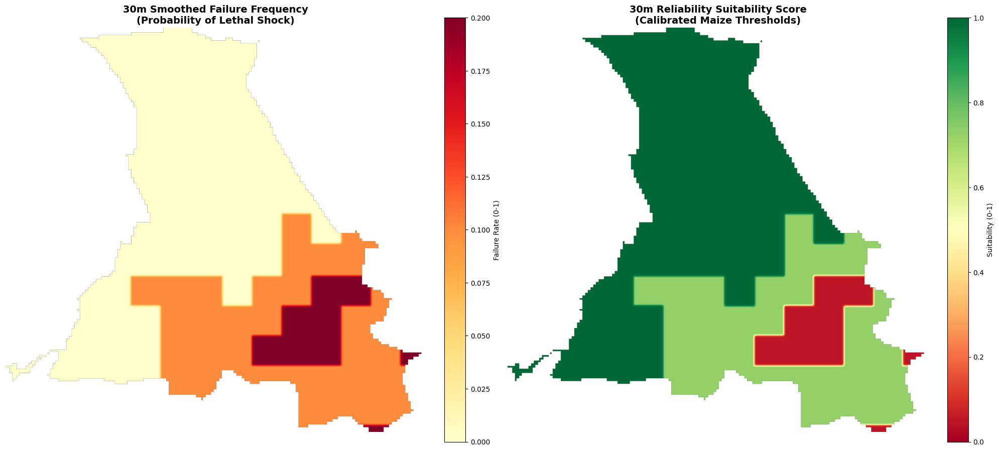

Max failure rate in Nandi: 20.00%
Min reliability score: 0.0500


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom, gaussian_filter

# --- 1. DEFINE RELIABILITY PARAMETERS ---
fail_vals = np.array([0.0, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.225, 0.25])
fail_suit = np.array([1.0, 0.98, 0.95, 0.88, 0.73, 0.5, 0.27, 0.12, 0.05, 0.02, 0.0])

# --- 2. DATA PREP & SCALING ---
# Match dimensions to your 30m elevation anchor
target_shape = raw_elevation.shape
z_factors = [t/s for t, s in zip(target_shape, fail_freq_10y.shape)]

# --- 3. THE "PROBABILITY MELT" ---
# We upscale and apply a Gaussian blur (sigma=3)
# This removes the blocky transitions between the climate grids
fail_freq_30m = zoom(fail_freq_10y.astype(np.float32), z_factors, order=1)
fail_freq_30m = gaussian_filter(fail_freq_30m, sigma=3)

# --- 4. CALCULATE SUITABILITY ---
# Convert the smoothed 30m failure frequency into a 0.0-1.0 score
s_reliability_30m = score_continuous(fail_freq_30m, fail_vals, fail_suit)

# --- 5. VISUAL AUDIT ---
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# Left: Raw Probability of Failure
im1 = ax[0].imshow(fail_freq_30m, cmap='YlOrRd')
ax[0].set_title("30m Smoothed Failure Frequency\n(Probability of Lethal Shock)", fontsize=14, fontweight='bold')
plt.colorbar(im1, ax=ax[0], label="Failure Rate (0-1)", fraction=0.046, pad=0.04)

# Right: Reliability Suitability Score
im2 = ax[1].imshow(s_reliability_30m, cmap='RdYlGn', vmin=0, vmax=1)
ax[1].set_title("30m Reliability Suitability Score\n(Calibrated Maize Thresholds)", fontsize=14, fontweight='bold')
plt.colorbar(im2, ax=ax[1], label="Suitability (0-1)", fraction=0.046, pad=0.04)

for a in ax: a.axis('off')
plt.tight_layout()
plt.show()

# Quick Check
print(f"Max failure rate in Nandi: {np.nanmax(fail_freq_30m)*100:.2f}%")
print(f"Min reliability score: {np.nanmin(s_reliability_30m):.4f}")

/tmp/ipython-input-3633782376.py:49: RuntimeWarning: All-NaN axis encountered
  climate_suitability = np.nanmin([s_temp, s_precip, s_reliability], axis=0)


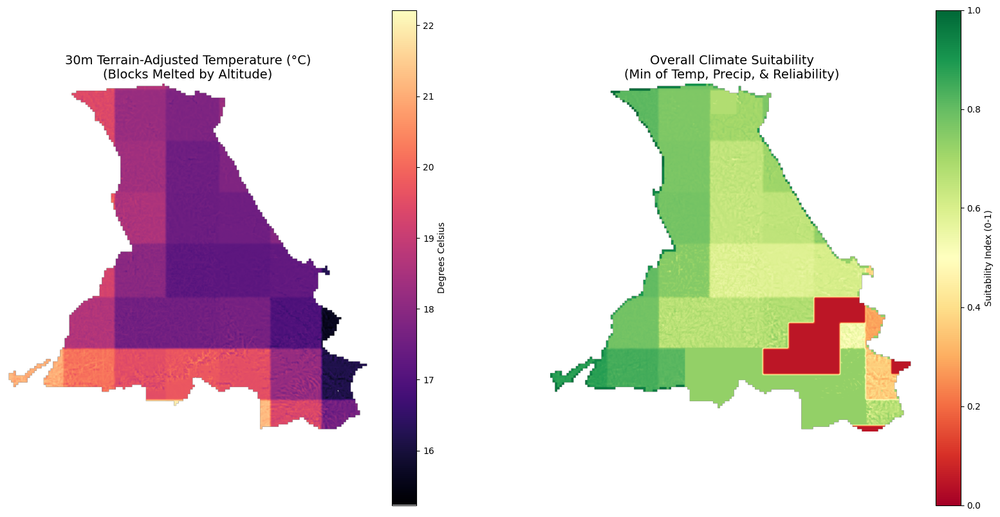

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

# --- 1. Load Data ---
# Climate layers (500m)
mean_precip_10y = get_stack_band(file_path, 1)
mean_temp_10y   = get_stack_band(file_path, 2)
fail_freq_10y   = get_stack_band(file_path, 3)

# High-Res Anchor (30m) - This allows us to "melt" the blocks
raw_elevation = get_layer_fixed("Elevation_30m.tif", divisor=1.0, mask_zeros=True)

# --- 2. Downscaling & Melting Logic ---
# We must resample and adjust BEFORE scoring suitability

# A. Calculate spatial scaling factor (ratio of 30m pixels to climate pixels)
z_factors = [t/s for t, s in zip(raw_elevation.shape, mean_temp_10y.shape)]

# B. Melt Temperature (Lapse Rate Correction)
# 1. Bilinear Interpolation (order=1) removes the jagged block edges
temp_30m_smooth = zoom(mean_temp_10y, z_factors, order=1)

# 2. Get the Reference Elevation (The 'plateau' elevation the climate model saw)
elev_base = zoom(zoom(raw_elevation, [1/z for z in z_factors], order=1), z_factors, order=1)

# 3. Apply the physics: -0.65°C per 100m altitude delta
temp_30m_adj = temp_30m_smooth + ((raw_elevation - elev_base) * -0.0065)

# C. Melt Precipitation & Reliability (Bilinear Smoothing only)
precip_30m = zoom(mean_precip_10y, z_factors, order=1)
fail_freq_30m = zoom(fail_freq_10y, z_factors, order=1)

# --- 3. Score Suitability (Using Adjusted 30m Data) ---

# Reliability: Scoring the smoothed probability of shocks
fail_vals = [0.0, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.225, 0.25]
fail_suit = [1.0, 0.98, 0.95, 0.88, 0.73, 0.5, 0.27, 0.12, 0.05, 0.02, 0.0]
s_reliability = score_continuous(fail_freq_30m, fail_vals, fail_suit)

# Temperature: Scoring the terrain-aware 30m temperature
s_temp = score_continuous(temp_30m_adj, t_vals, t_suit)

# Precipitation: Scoring the smoothed 30m rain
s_precip = score_continuous(precip_30m, p_vals, p_suit)

# --- 4. Final Climate Pillar (Law of the Minimum) ---
# For every 30m pixel, we take the most restrictive climate factor
climate_suitability = np.nanmin([s_temp, s_precip, s_reliability], axis=0)

# --- 5. Professional Mapping ---
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# View 1: The Physics (Temperature Adjustment)
im1 = ax[0].imshow(temp_30m_adj, cmap='magma')
ax[0].set_title("30m Terrain-Adjusted Temperature (°C)\n(Blocks Melted by Altitude)", fontsize=14)
plt.colorbar(im1, ax=ax[0], label="Degrees Celsius")

# View 2: The Outcome (Suitability)
im2 = ax[1].imshow(climate_suitability, cmap='RdYlGn', vmin=0, vmax=1)
ax[1].set_title("Overall Climate Suitability\n(Min of Temp, Precip, & Reliability)", fontsize=14)
plt.colorbar(im2, ax=ax[1], label="Suitability Index (0-1)")

for a in ax: a.axis('off')
plt.show()

NameError: name 'reliability_score_res' is not defined

###Suitability Calculations

/tmp/ipython-input-2400508778.py:26: RuntimeWarning: All-NaN axis encountered
  s_soil = np.nanmin(soil_stack, axis=0)
/tmp/ipython-input-2400508778.py:30: RuntimeWarning: All-NaN axis encountered
  s_climate = np.nanmin(climate_stack, axis=0)
/tmp/ipython-input-2400508778.py:34: RuntimeWarning: All-NaN axis encountered
  total_suitability = np.nanmin([s_soil, s_climate, score_slope], axis=0)


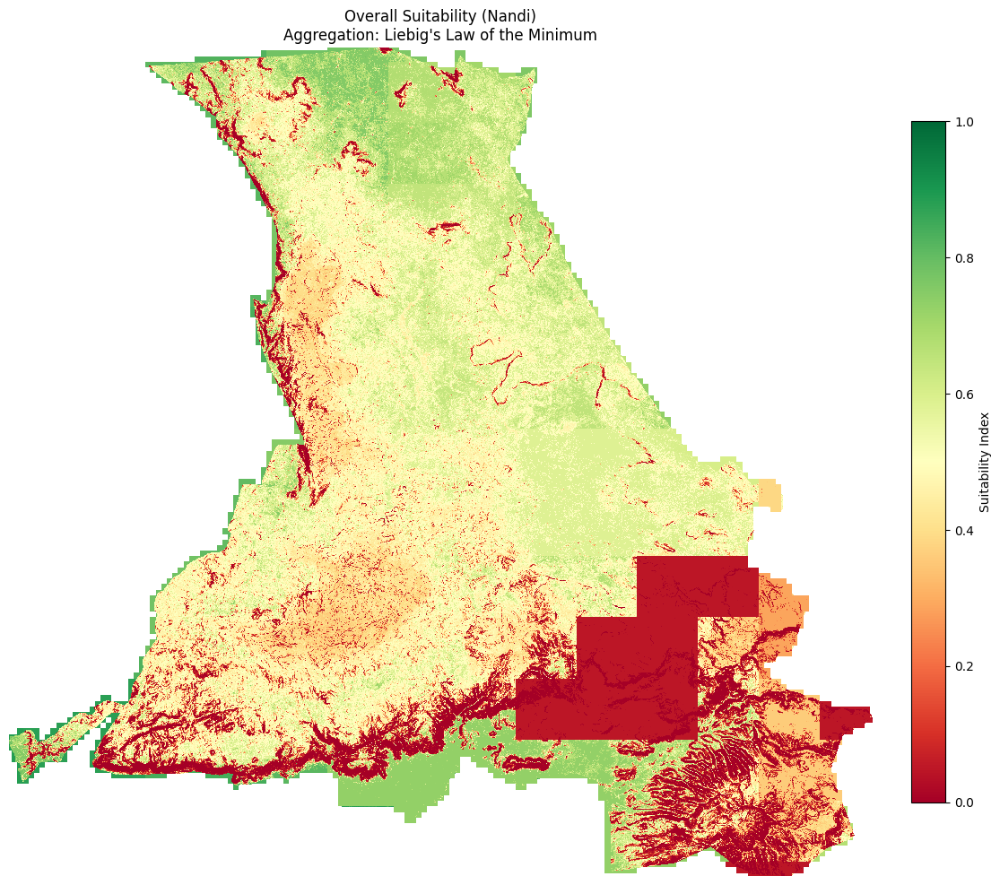

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

def match_shape(source, target_shape):
    """Rescales an array to match the target shape using nearest-neighbor."""
    if source.shape == target_shape:
        return source

    # Calculate zoom factors for y and x axes
    zoom_factors = [t/s for t, s in zip(target_shape, source.shape)]
    return zoom(source, zoom_factors, order=0) # order=0 is nearest-neighbor (fastest)

# --- STEP 1: RESAMPLE CLIMATE TO SOIL RESOLUTION ---
# We assume the Soil layers (e.g., score_ph) are the "Target" high-res grid
target_shape = score_ph.shape

s_temp_res = match_shape(s_temp, target_shape)
s_precip_res = match_shape(s_precip, target_shape)
s_reliability_res = match_shape(reliability_score, target_shape)

# --- STEP 2: CALCULATE THE PILLARS ---

# A. Soil Pillar (Already 30m)
soil_stack = [score_ph, score_carbon, score_texture, score_depth, score_stones, score_cec]
s_soil = np.nanmin(soil_stack, axis=0)

# B. Climate Pillar (Now Resampled to 30m)
climate_stack = [s_temp_res, s_precip_res, s_reliability_res]
s_climate = np.nanmin(climate_stack, axis=0)

# C. Final Overall Suitability
# Now all arrays are identical shapes, no more ValueError!
total_suitability = np.nanmin([s_soil, s_climate, score_slope], axis=0)

# --- STEP 3: PLOTTING ---
plt.figure(figsize=(14, 12))
im = plt.imshow(total_suitability, cmap='RdYlGn', vmin=0, vmax=1, interpolation='none')
plt.colorbar(im, fraction=0.035, pad=0.04, label='Suitability Index')
plt.title(f"Overall Suitability (Nandi)\nAggregation: Liebig's Law of the Minimum")
plt.axis('off')
plt.show()

###Further Extraction

In [ ]:
import ee
import geopandas as gpd
import os

# 1. Initialize
project_id = 'nandi-seed-recommender'
try:
    ee.Initialize(project=project_id)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=project_id)

# 2. Region of Interest (Nandi)
shapefile_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/NandiCounties/counties.shp'
output_folder = '01_Nandi_Seed_Recommender_System/Soil_Data'
gdf = gpd.read_file(shapefile_path)
nandi_roi = ee.Geometry(gdf[gdf['COUNTY_NAM'] == 'NANDI'].union_all().__geo_interface__)

def get_calibrated_reliability_stack(start_month, start_day, label):
    # Analyzing the last decade (2015-2024)
    years = ee.List.sequence(2015, 2024)

    def calculate_annual(year):
        year = ee.Number(year)
        start_date = ee.Date.fromYMD(year, start_month, start_day)
        end_date = start_date.advance(110, 'day')

        # Load Datasets
        precip_col = ee.ImageCollection("UCSB-CHG/CHIRPS/DAILY").filterDate(start_date, end_date).select('precipitation')
        temp_col = ee.ImageCollection("ECMWF/ERA5_LAND/DAILY_AGGR").filterDate(start_date, end_date)

        # Helper for consecutive thresholds
        def check_consecutive(collection, band, window, thresh, op):
            col_list = collection.toList(110)
            indices = ee.List.sequence(0, ee.Number(110).subtract(window))
            def check_win(i):
                win = ee.ImageCollection(col_list.slice(ee.Number(i), ee.Number(i).add(window)))
                return win.select(band).min().gt(thresh) if op == 'gt' else win.select(band).max().lt(thresh)
            return ee.ImageCollection(indices.map(check_win)).max()

        # --- Calibrated Lethal Metrics ---

        # 1. 28-Day Drought (Calibrated for Nandi Clay Water Holding Capacity)
        drought_fail = check_consecutive(precip_col, 'precipitation', 28, 1, 'lt')

        # 2. 180mm Flood (3-day sum > 180mm - adjusted for hillside drainage)
        prec_list = precip_col.toList(110)
        flood_fail = ee.ImageCollection(ee.List.sequence(0, 110-3).map(lambda i:
            ee.ImageCollection(prec_list.slice(ee.Number(i), ee.Number(i).add(3))).sum().gt(180))).max()

        # 3. Cold Threshold (< 13.0°C mean - adjusted for high-altitude acclimatization)
        mean_t = temp_col.select('temperature_2m').mean().subtract(273.15)
        cold_fail = mean_t.lt(13.0)

        # Survival Logic: 1 if NO failure occurred, 0 otherwise
        any_failure = drought_fail.Or(flood_fail).Or(cold_fail)
        survived = any_failure.Not().rename('survived')

        # Climate Averages for Suitability Scoring
        total_p = precip_col.sum().rename('tp')
        mean_t_val = mean_t.rename('mt')

        return ee.Image.cat([total_p, mean_t_val, survived])

    # Map across years
    ten_year_col = ee.ImageCollection(years.map(calculate_annual))

    # Final Aggregates
    avg_precip = ten_year_col.select('tp').mean().rename('mean_precip')
    avg_temp = ten_year_col.select('mt').mean().rename('mean_temp')

    # freq_crop_fail: 1 - mean(survival)
    fail_freq = ee.Image(1).subtract(ten_year_col.select('survived').mean()).rename('freq_crop_fail')

    return ee.Image.cat([avg_precip, avg_temp, fail_freq]).clip(nandi_roi)

# --- EXECUTION ---
seasons = [(3, 1, "LongRains_Calibrated"), (10, 1, "ShortRains_Calibrated")]

for month, day, label in seasons:
    stack = get_calibrated_reliability_stack(month, day, label)
    task = ee.batch.Export.image.toDrive(
        image=stack.float(),
        description=f"Maize_Climate_Reliability_{label}_28Day",
        folder=output_folder,
        region=nandi_roi,
        scale=500,
        crs='EPSG:4326',
        maxPixels=1e9
    )
    task.start()
    print(f"Submitted 10-Year Calibrated Task: {label}")

Submitted 10-Year Calibrated Task: LongRains_Calibrated
Submitted 10-Year Calibrated Task: ShortRains_Calibrated


Loading Data & Correcting Units...
Calculating Soil Potential...
Calculating Best Climate Window...
Finalizing...


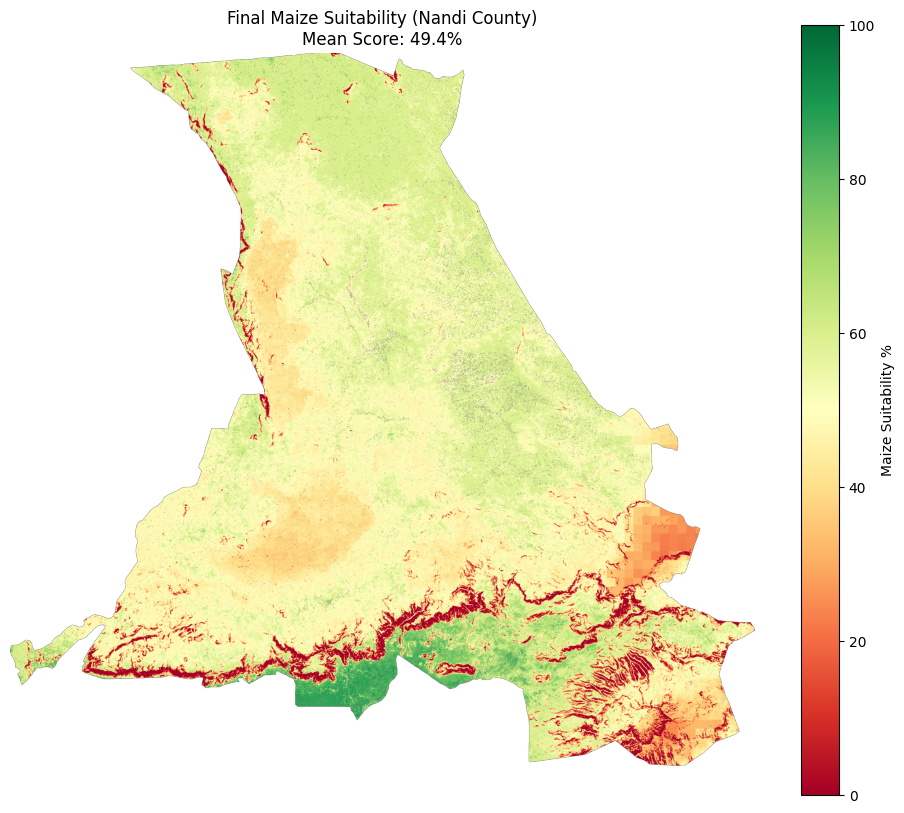

DONE! Files saved to: /content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Outputs


In [ ]:
# Final Robust Maize Recommender System
import rasterio
import numpy as np
import os
import matplotlib.pyplot as plt

# --- 1. CONFIGURATION ---
data_folder = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Soil_Data'
output_folder = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Outputs'
if not os.path.exists(output_folder): os.makedirs(output_folder)

# Maize Parameters
growing_cycle_days = 110
growing_months_count = int(np.ceil(growing_cycle_days / 30)) # 4 months

# --- 2. SCORING FUNCTIONS ---
def score_continuous(val_array, x_vals, y_suit):
    """Fuzzy logic scoring for continuous variables."""
    if val_array is None: return None
    # Interp handles the math, we preserve NaNs
    scores = np.interp(val_array, x_vals, y_suit)
    return scores

def score_categorical(val_array, cat_map):
    """Discrete scoring for texture classes."""
    if val_array is None: return None
    output = np.zeros_like(val_array, dtype=np.float32)
    for cat, score in cat_map.items():
        output[val_array == cat] = score
    return output

# --- 3. DATA LOADER (With Unit Fixes) ---
def get_layer(filename, divisor=1.0):
    path = os.path.join(data_folder, filename)
    if not os.path.exists(path):
        print(f"MISSING: {filename} (Using Neutral 1.0)")
        return None
    with rasterio.open(path) as src:
        data = src.read(1).astype(np.float32)
        # Mask NoData (negative or zero)
        data = np.where(data <= 0, np.nan, data)
        return data / divisor

print("Loading Data & Correcting Units...")

# A. Soil Physical Properties
# pH: iSDA is Int*10 -> Divide by 10
ph = get_layer("pH_0-20cm.tif", divisor=10.0)

# Carbon: iSDA is g/kg -> Divide by 10 to get %
carbon = get_layer("Organic_Carbon_0-20cm.tif", divisor=10.0)

# Slope: Degrees -> No conversion needed
slope = get_layer("Slope_Degrees.tif", divisor=1.0)

# Depth: iSDA is cm -> Divide by 100 to get Meters
depth = get_layer("Bedrock_Depth_0-200cm.tif", divisor=100.0)

# Stones: iSDA is Weight-% -> Divide by 2.0 to approx Volume-%
stones = get_layer("stone_content_0-20cm.tif", divisor=2.0)

# Texture: Classes 1-13 -> No conversion
texture = get_layer("Texture_Class_0-20cm.tif", divisor=1.0)

# B. Base Saturation Calculation
ca = get_layer("Calcium_0-20cm.tif")
mg = get_layer("Magnesium_0-20cm.tif")
k = get_layer("Potassium_0-20cm.tif")
cec = get_layer("cation_exchange_capacity_0-20cm.tif")

if all(x is not None for x in [ca, mg, k, cec]):
    # Formula: (Ca + Mg + K) / CEC * 100
    # Use np.divide to prevent crash on zero/nan
    base_sat = np.divide((ca + mg + k), cec, out=np.zeros_like(ca), where=cec!=0) * 100
    base_sat = np.clip(base_sat, 0, 100) # Cap at 100%
else:
    print("Missing Nutrients. Defaulting Base Saturation to 50%.")
    base_sat = np.full_like(ph, 50)

# --- 4. CALCULATE SOIL SUITABILITY ---
print("Calculating Soil Potential...")

# pH Rule (Maize): 5.5-7.0 is best. <4.5 is death.
s_ph = score_continuous(ph,
    [4.5, 5.0, 5.5, 5.8, 6.2, 6.6, 7.0, 7.8, 8.2, 8.5],
    [0.0, 0.33, 0.5, 0.75, 0.92, 1.0, 0.92, 0.75, 0.33, 0.0])

# Carbon Rule: Higher is better. >2% is max score.
s_carbon = score_continuous(carbon, [0.0, 0.5, 0.8, 1.2, 2.0], [0.0, 0.33, 0.75, 0.92, 1.0])

# Slope Rule (Relaxed for Nandi):
# 0-2 (1.0) ... 8 (0.75) ... 15 (0.5) ... >25 (0.0)
s_slope = score_continuous(slope, [0, 2, 8, 15, 25], [1.0, 0.92, 0.75, 0.5, 0.0])

# Depth Rule: >1m is best.
s_depth = score_continuous(depth, [0.2, 1.0], [0.0, 1.0])

# Stones Rule (Vol %): >55% is death.
s_stones = score_continuous(stones, [0, 3, 15, 35, 55], [1, 0.92, 0.75, 0.33, 0])

# Base Saturation Rule: >50% is good.
s_bs = score_continuous(base_sat, [20, 35, 50, 80, 100], [0, 0.33, 0.75, 0.92, 1.0])

# Texture Rule: Modified to give Clay (Class 1 & 2) a fighting chance (0.6 instead of 0)
tex_rules = {
    1: 0.6, 2: 0.6, # Clay/Silty Clay
    3: 1.0, 4: 1.0, 5: 1.0, 6: 1.0, 7: 1.0, # Loams/Clays (Optimal)
    8: 0.92, 9: 0.92, 10: 0.92, # Sandy Loams
    11: 0.75, 12: 0.75, 13: 0.0 # Sands / Peat
}
s_texture = score_categorical(texture, tex_rules)

# Aggregate Soil Score (Liebig's Law - Minimum Limiting Factor)
soil_suitability = np.minimum.reduce([s_ph, s_carbon, s_slope, s_depth, s_stones, s_texture, s_bs])

# --- 5. CLIMATE ENGINE (Rolling Window) ---
print("Calculating Best Climate Window...")

best_climate_score = np.zeros_like(ph)
best_planting_month = np.zeros_like(ph)

precip_stack = []
temp_stack = []

# Load Weather
for i in range(1, 13):
    m_names = ["", "Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    p = get_layer(f"Precipitation_{i:02d}_{m_names[i]}.tif")
    t = get_layer(f"Temperature_{i:02d}_{m_names[i]}.tif", divisor=10.0) # Temp needs /10

    if p is None: p = np.zeros_like(ph)
    if t is None: t = np.zeros_like(ph)

    precip_stack.append(np.nan_to_num(p))
    temp_stack.append(np.nan_to_num(t))

# Rolling Loop
for start_idx in range(12):
    indices = [(start_idx + i) % 12 for i in range(growing_months_count)]

    # Sum Rain & Avg Temp for this window
    cycle_rain = np.sum([precip_stack[i] for i in indices], axis=0)
    cycle_temp = np.mean([temp_stack[i] for i in indices], axis=0)

    # Maize Rain Rules
    s_rain = score_continuous(cycle_rain,
        [200, 300, 400, 500, 600, 750, 900, 1200, 1600, 2000],
        [0.0, 0.1, 0.33, 0.75, 0.92, 1.0, 0.92, 0.75, 0.33, 0.3])

    # Maize Temp Rules
    s_temp = score_continuous(cycle_temp,
        [13, 14, 16, 18, 22, 24, 26, 32, 35, 40],
        [0.0, 0.1, 0.33, 0.75, 0.92, 1.0, 0.92, 0.75, 0.33, 0.0])

    # Window Score
    window_score = np.minimum(s_rain, s_temp)

    # Update Best
    mask = window_score > best_climate_score
    best_climate_score[mask] = window_score[mask]
    best_planting_month[mask] = start_idx + 1

# --- 6. FINAL AGGREGATION ---
print("Finalizing...")

# Combine Soil & Best Climate
final_suitability = np.minimum(soil_suitability, best_climate_score) * 100

# Mask Background
final_suitability = np.where(np.isnan(ph), np.nan, final_suitability)

# Plot
plt.figure(figsize=(12, 10))
plt.imshow(final_suitability, cmap='RdYlGn', vmin=0, vmax=100)
plt.colorbar(label="Maize Suitability %")
plt.title(f"Final Maize Suitability (Nandi County)\nMean Score: {np.nanmean(final_suitability):.1f}%")
plt.axis('off')
plt.show()

# Save Files
profile = None
with rasterio.open(os.path.join(data_folder, "pH_0-20cm.tif")) as src:
    profile = src.profile
    profile.update(dtype=rasterio.float32, count=1, nodata=np.nan)

# Save Suitability
out_path = os.path.join(output_folder, "Maize_Suitability_Final.tif")
with rasterio.open(out_path, 'w', **profile) as dst:
    dst.write(final_suitability.astype(rasterio.float32), 1)

# Save Planting Date
out_path_date = os.path.join(output_folder, "Maize_Optimal_Planting_Month.tif")
with rasterio.open(out_path_date, 'w', **profile) as dst:
    dst.write(best_planting_month.astype(rasterio.float32), 1)

print(f"DONE! Files saved to: {output_folder}")

#Investigating Yield Data

In [ ]:
import pandas as pd
import os

# Configuration
yield_folder = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data'
files = [
    'GROW-Africa_Regional.xlsx',
    'GROW-Africa_Point.xlsx',
    'GROW-Africa_LSMS_cropcut.xlsx',
    'GROW-Africa_LSMS_survey.xlsx'
]

for file_name in files:
    path = os.path.join(yield_folder, file_name)
    print(f"\n{'='*60}")

    if os.path.exists(path):
        print(f"FILE: {file_name}")
        # Using openpyxl as the engine for Excel files
        try:
            df = pd.read_excel(path)
            print(f"Rows: {df.shape[0]} | Columns: {df.shape[1]}")
            print(f"Columns: {df.columns.tolist()}")
            display(df.head(3))
        except Exception as e:
            print(f"Error loading {file_name}: {e}")
    else:
        print(f"FILE NOT FOUND: {file_name}")

print(f"{'='*60}")


FILE: GROW-Africa_Regional.xlsx
Rows: 197535 | Columns: 25
Columns: ['GDAM_ID', 'country', 'country_code', 'admin_1', 'admin_2', 'level', 'crop', 'season_name', 'planting_year', 'planting_month', 'harvest_year', 'harvest_month', 'crop_production_system', 'areaHa', 'productionTon', 'yieldTonHa', 'QC_flag_A', 'QC_flag_P', 'QC_flag_Y', 'Source', 'L0_GID', 'L1_GID', 'L2_GID', 'L3_GID', 'originalname']


,GDAM_ID,country,country_code,admin_1,admin_2,level,crop,season_name,planting_year,planting_month,...,yieldTonHa,QC_flag_A,QC_flag_P,QC_flag_Y,Source,L0_GID,L1_GID,L2_GID,L3_GID,originalname
0,L0AGO003,Angola,AO,none,none,0.0,Banana,Main,NaN,NaN,...,0.4444,E,X,E,FAOSTAT,L0AGO003,NaN,NaN,NaN,Bananas
1,L0AGO003,Angola,AO,none,none,0.0,Banana,Main,NaN,NaN,...,0.7143,A,A,A,FAOSTAT,L0AGO003,NaN,NaN,NaN,Bananas
2,L0AGO003,Angola,AO,none,none,0.0,Banana,Main,NaN,NaN,...,0.6981,A,A,A,FAOSTAT,L0AGO003,NaN,NaN,NaN,Bananas



FILE: GROW-Africa_Point.xlsx
Rows: 131812 | Columns: 17
Columns: ['Source', 'Crop', 'HarvestYear', 'Latitude', 'Longitude', 'SpatialPrecision_km_', 'L0_GID', 'L1_GID', 'L2_GID', 'L3_GID', 'Country', 'SiteName', 'Area_ha_', 'Yield_ton_ha_', 'PlantDate', 'HarvestDate', 'Notes']


,Source,Crop,HarvestYear,Latitude,Longitude,SpatialPrecision_km_,L0_GID,L1_GID,L2_GID,L3_GID,Country,SiteName,Area_ha_,Yield_ton_ha_,PlantDate,HarvestDate,Notes
0,Corbeels2020,Sorghum,2004.0,7.2,5.583333,1.85,L0NGA170,L1NGA2175,L2NGA26956,NaN,Nigeria,"RUGIPO station, Owo, Nigeria",NaN,0.57,NaN,NaN,ConventionalTillage
1,Corbeels2020,Sorghum,2005.0,7.2,5.583333,1.85,L0NGA170,L1NGA2175,L2NGA26956,NaN,Nigeria,"RUGIPO station, Owo, Nigeria",NaN,1.55,NaN,NaN,ConventionalTillage
2,Corbeels2020,Sorghum,2006.0,7.2,5.583333,1.85,L0NGA170,L1NGA2175,L2NGA26956,NaN,Nigeria,"RUGIPO station, Owo, Nigeria",NaN,1.36,NaN,NaN,ConventionalTillage



FILE: GROW-Africa_LSMS_cropcut.xlsx
Rows: 11345 | Columns: 20
Columns: ['Country', 'Source', 'Year', 'GPS_lat', 'GPS_lon', 'L0_GID', 'L1_GID', 'L2_GID', 'L3_GID', 'holder_id', 'household_id', 'parcel_id', 'field_id', 'Crop', 'crop_origname', 'cropCutDay', 'cropCutMonth', 'freshWeightKg', 'dryWeightKg', 'Yield_ton_ha_']


,Country,Source,Year,GPS_lat,GPS_lon,L0_GID,L1_GID,L2_GID,L3_GID,holder_id,household_id,parcel_id,field_id,Crop,crop_origname,cropCutDay,cropCutMonth,freshWeightKg,dryWeightKg,Yield_ton_ha_
0,Ethiopia,ETH2011,2012,14.353816,37.890876,L0ETH075,L1ETH0927,L2ETH14659,L3ETH31770,1.010102e+14,1.010102e+12,1,4,Sorghum,SORGHUM,30.0,2.0,0.90,0.81,0.50625
1,Ethiopia,ETH2011,2012,14.353816,37.890876,L0ETH075,L1ETH0927,L2ETH14659,L3ETH31770,1.010102e+14,1.010102e+12,1,2,Millet,MILLET,8.0,2.0,0.20,0.20,0.12500
2,Ethiopia,ETH2011,2012,14.353816,37.890876,L0ETH075,L1ETH0927,L2ETH14659,L3ETH31770,1.010102e+14,1.010102e+12,2,1,Millet,MILLET,18.0,2.0,0.48,0.47,0.29375



FILE: GROW-Africa_LSMS_survey.xlsx
Rows: 195152 | Columns: 27
Columns: ['Country', 'Source1', 'Source2', 'Source', 'GPS_lat', 'GPS_lon', 'L0_GID', 'L1_GID', 'L2_GID', 'L3_GID', 'Crop', 'prcCrop', 'prcLeft', 'Prod_kg_', 'ProdEst2_kg_', 'ReportedArea_ha_', 'GPSArea_ha_', 'Yield_ton_ha_', 'YieldUsingGPS_ton_ha_', 'YieldEst2_ton_ha_', 'YieldEst2UsingGPS_ton_ha_', 'AgYearStart', 'AgYearEnd', 'hhid', 'parcel_id', 'plotid', 'SpatialPrecision_km_']


,Country,Source1,Source2,Source,GPS_lat,GPS_lon,L0_GID,L1_GID,L2_GID,L3_GID,...,Yield_ton_ha_,YieldUsingGPS_ton_ha_,YieldEst2_ton_ha_,YieldEst2UsingGPS_ton_ha_,AgYearStart,AgYearEnd,hhid,parcel_id,plotid,SpatialPrecision_km_
0,Nigeria,LSMS,NGA2010,LSMS_NGA2010,5.142033,7.374716,L0NGA170,L1NGA2147,L2NGA26363,NaN,...,NaN,10.666667,NaN,NaN,2010,2011.0,10039,NaN,1,5
1,Nigeria,LSMS,NGA2010,LSMS_NGA2010,5.315248,7.433435,L0NGA170,L1NGA2147,L2NGA26361,NaN,...,NaN,1.530482,NaN,NaN,2010,2011.0,10069,NaN,1,5
2,Nigeria,LSMS,NGA2010,LSMS_NGA2010,5.315248,7.433435,L0NGA170,L1NGA2147,L2NGA26361,NaN,...,NaN,1.859197,NaN,NaN,2010,2011.0,10069,NaN,2,5


In [ ]:
# @title Soil-Yield Data Cleaning & Master Integration
import pandas as pd
import geopandas as gpd
import rasterio
import os
import numpy as np

# --- 1. PATHS ---
yield_csv_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Only_Yield_Data.csv'
soil_folder = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Soil_Data'
output_ml_csv = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Yield_Soil_Master.csv'

# --- 2. LOAD DATA ---
df = pd.read_csv(yield_csv_path)

# --- 3. CLEAN EXISTING CLIMATE DATA ---
# We remove any columns previously appended that have "Precip" or "Temp"
# This ensures we don't mix old static data with our new high-res time-series data.
cols_to_remove = [c for c in df.columns if 'precip' in c.lower() or 'temp' in c.lower()]
df = df.drop(columns=cols_to_remove)
print(f"Removed {len(cols_to_remove)} old climate columns: {cols_to_remove}")

lat_col = [c for c in df.columns if 'lat' in c.lower()][0]
lon_col = [c for c in df.columns if 'lon' in c.lower()][0]

# --- 4. IDENTIFY STATIC SOIL FILES ---
# Filter out precipitation/temperature files from the folder loop
all_files = [f for f in os.listdir(soil_folder) if f.endswith('.tif')]
soil_files = [f for f in all_files if 'precip' not in f.lower() and 'temp' not in f.lower()]

# --- 5. EXTRACTION FUNCTION ---
def sample_raster(df, raster_path, col_name):
    with rasterio.open(raster_path) as src:
        coords = zip(df[lon_col], df[lat_col])
        values = [v[0] for v in src.sample(coords)]
        values = np.array(values, dtype=float)
        values[values < -1000] = np.nan

        # Scaling correction for iSDA data
        if any(x in col_name.lower() for x in ['ph', 'organic_carbon', 'nitrogen', 'cec']):
            values = values / 10.0
        return values

# --- 6. RUN EXTRACTION FOR SOIL ONLY ---
print(f"Sampling {len(soil_files)} static soil layers...")
for file_name in soil_files:
    column_name = file_name.replace('.tif', '')
    raster_path = os.path.join(soil_folder, file_name)
    df[column_name] = sample_raster(df, raster_path, column_name)

# --- 7. SAVE MASTER (Ready for GEE Climate Step) ---
df_clean = df.dropna(subset=[soil_files[0].replace('.tif', '')])
df_clean.to_csv(output_ml_csv, index=False)

print(f"Final Soil-Only Master CSV saved with {df_clean.shape[1]} columns.")
print("Proceed to GEE step for Rain_mm, Rainy_Days, and Temp_Max/Min extraction.")

Removed 0 old climate columns: []
Sampling 38 static soil layers...
Final Soil-Only Master CSV saved with 63 columns.
Proceed to GEE step for Rain_mm, Rainy_Days, and Temp_Max/Min extraction.


In [ ]:
import ee
# Trigger the authentication flow.
ee.Authenticate()
# Initialize the library.
ee.Initialize(project='nandi-seed-recommender') # Replace with your GEE project ID

In [ ]:
# @title Strict Date Cleanup
import pandas as pd

# --- 1. PATHS ---
input_master_csv = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Yield_Soil_Master.csv'
output_clean_csv = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Yield_Soil_Master_Clean.csv'

# --- 2. LOAD & FILTER ---
df = pd.read_csv(input_master_csv)

initial_count = len(df)

# Drop rows if EITHER Plant_Date or Harvest_Date is NaN/Null
# Note: Ensure column names match your CSV exactly
df_clean = df.dropna(subset=['PlantDate', 'HarvestDate'])

final_count = len(df_clean)
dropped = initial_count - final_count

# --- 3. SAVE ---
df_clean.to_csv(output_clean_csv, index=False)

print(f"Cleanup Complete.")
print(f"Initial rows: {initial_count}")
print(f"Rows dropped: {dropped}")
print(f"Final high-quality rows: {final_count}")

Cleanup Complete.
Initial rows: 1218
Rows dropped: 240
Final high-quality rows: 978


In [ ]:
# @title GEE Final Climate Extraction
import pandas as pd
import ee

# 1. INITIALIZE (Use your specific Project ID)
try:
    ee.Initialize(project='nandi-seed-recommender')
    print("GEE Initialized Successfully")
except Exception as e:
    print(f"Initialization Failed: {e}")

# 2. LOAD DATA
input_csv = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Yield_Soil_Master_Clean.csv'
output_final_csv = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Final_ML_Ready.csv'

df = pd.read_csv(input_csv)

# 3. CONVERT DATES
# Note: Using your exact column names 'PlantDate' and 'HarvestDate'
df['Plant_Date_DT'] = pd.to_datetime(df['PlantDate'], unit='D', origin='1899-12-30')
df['Harvest_Date_DT'] = pd.to_datetime(df['HarvestDate'], unit='D', origin='1899-12-30')
df['Season_Duration'] = (df['Harvest_Date_DT'] - df['Plant_Date_DT']).dt.days

def get_seasonal_weather(row):
    try:
        start = ee.Date(row['Plant_Date_DT'].strftime('%Y-%m-%d'))
        end = ee.Date(row['Harvest_Date_DT'].strftime('%Y-%m-%d')).advance(1, 'day')

        # Using your exact column names 'Longitude' and 'Latitude'
        point = ee.Geometry.Point([row['Longitude'], row['Latitude']])

        # --- RAINFALL (CHIRPS) ---
        chirps = ee.ImageCollection("UCSB-CHG/CHIRPS/DAILY").filterDate(start, end).select('precipitation')
        total_rain = chirps.sum().reduceRegion(ee.Reducer.first(), point, 5000).get('precipitation').getInfo()
        rainy_days = chirps.map(lambda img: img.gt(1)).sum().reduceRegion(ee.Reducer.first(), point, 5000).get('precipitation').getInfo()

        # --- TEMPERATURE (ERA5-LAND) ---
        era5 = ee.ImageCollection("ECMWF/ERA5_LAND/HOURLY").filterDate(start, end).select('temperature_2m')

        # Get stats and convert Kelvin to Celsius
        t_stats = era5.reduce(ee.Reducer.minMax().combine(ee.Reducer.mean(), "", True))
        t_data = t_stats.reduceRegion(ee.Reducer.first(), point, 9000).getInfo()

        t_max = t_data['temperature_2m_max'] - 273.15
        t_min = t_data['temperature_2m_min'] - 273.15
        t_mean = t_data['temperature_2m_mean'] - 273.15

        return pd.Series([total_rain, rainy_days, t_mean, t_max, t_min])
    except Exception:
        return pd.Series([None, None, None, None, None])

# 4. EXECUTE EXTRACTION
print(f"Extracting weather for {len(df)} points in Nandi...")
df[['Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min']] = df.apply(get_seasonal_weather, axis=1)

# 5. FINAL CLEANUP & SAVE
df_final = df.dropna(subset=['Rain_mm'])
df_final.to_csv(output_final_csv, index=False)

print(f"Success! Final dataset saved with {len(df_final)} rows.")
print(f"New columns: Rain_mm, Rainy_Days, Temp_Mean, Temp_Max, Temp_Min, Season_Duration")

GEE Initialized Successfully
Extracting weather for 978 points in Nandi...


KeyboardInterrupt: 

In [ ]:
# @title GEE Final Batch Extraction (Strict Row Drop)
import ee
import pandas as pd

# 1. Initialize
try:
    ee.Initialize(project='nandi-seed-recommender')
    print("GEE Initialized Successfully")
except Exception as e:
    print(f"Initialization Failed: {e}")

# 2. Load and Filter
df = pd.read_csv('/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Yield_Soil_Master_Clean.csv')

# Calculate Duration to find errors
df['P_DT'] = pd.to_datetime(df['PlantDate'], unit='D', origin='1899-12-30')
df['H_DT'] = pd.to_datetime(df['HarvestDate'], unit='D', origin='1899-12-30')
df['Duration'] = (df['H_DT'] - df['P_DT']).dt.days

# --- THE DROP ---
initial_count = len(df)
# We only keep rows where Harvest is strictly AFTER Planting
df = df[df['Duration'] > 0].copy()
dropped = initial_count - len(df)
print(f"Strict Drop Complete: Removed {dropped} rows with invalid dates.")
print(f"Processing remaining {len(df)} rows...")

# 3. Prepare for GEE
df['Plant_Date_GEE'] = df['P_DT'].dt.strftime('%Y-%m-%d')
df['Harvest_Date_GEE'] = df['H_DT'].dt.strftime('%Y-%m-%d')

features = []
for i, row in df.iterrows():
    # We pass the index as 'original_index' to ensure perfect merging later
    f = ee.Feature(ee.Geometry.Point([row['Longitude'], row['Latitude']]), {
        'orig_idx': i,
        'start': row['Plant_Date_GEE'],
        'end': row['Harvest_Date_GEE']
    })
    features.append(f)

fc = ee.FeatureCollection(features)

# 4. Define Weather Logic
def add_weather(feature):
    start = ee.Date(feature.get('start'))
    end = ee.Date(feature.get('end')).advance(1, 'day')
    geom = feature.geometry()

    # Rainfall
    precip = ee.ImageCollection("UCSB-CHG/CHIRPS/DAILY").filterDate(start, end).select('precipitation')
    rain_sum = precip.sum().reduceRegion(ee.Reducer.first(), geom, 5000).get('precipitation')
    rainy_days = precip.map(lambda img: img.gt(1)).sum().reduceRegion(ee.Reducer.first(), geom, 5000).get('precipitation')

    # Temperature
    era5 = ee.ImageCollection("ECMWF/ERA5_LAND/HOURLY").filterDate(start, end).select('temperature_2m')
    t_stats = era5.reduce(ee.Reducer.mean().combine(ee.Reducer.minMax(), "", True))
    t_vals = t_stats.reduceRegion(ee.Reducer.first(), geom, 9000)

    return feature.set({
        'Rain_mm': rain_sum,
        'Rainy_Days': rainy_days,
        'Temp_Mean': ee.Number(t_vals.get('temperature_2m_mean')).subtract(273.15),
        'Temp_Max': ee.Number(t_vals.get('temperature_2m_max')).subtract(273.15),
        'Temp_Min': ee.Number(t_vals.get('temperature_2m_min')).subtract(273.15)
    })

# 5. Run Parallel Extraction
print("Extracting weather data via GEE Batch Map (Estimated 2-4 mins)...")
results = fc.map(add_weather).getInfo()

# 6. Parse and Merge
extracted_data = [f['properties'] for f in results['features']]
df_weather = pd.DataFrame(extracted_data)

# Merge weather columns back to the filtered dataframe using the index
df_final = df.reset_index(drop=True).merge(
    df_weather[['orig_idx', 'Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min']],
    left_index=True, right_on='orig_idx', how='left'
)

# 7. Save Final Product
output_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Final_ML_Ready.csv'
df_final.to_csv(output_path, index=False)

print(f"Success! Final ML-ready dataset saved to: {output_path}")

GEE Initialized Successfully
Strict Drop Complete: Removed 5 rows with invalid dates.
Processing remaining 973 rows...
Extracting weather data via GEE Batch Map (Estimated 2-4 mins)...


Success! Final ML-ready dataset saved to: /content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Final_ML_Ready.csv


In [ ]:
# @title GEE Terrain Extraction (High Precision Decimals)
import ee
import pandas as pd

# 1. Initialize
ee.Initialize(project='nandi-seed-recommender')

# 2. Load the current cleaned dataset
input_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Final_ML_Ready.csv'
df = pd.read_csv(input_path)

# 3. Load Terrain Data (NASA SRTM 30m)
terrain = ee.Algorithms.Terrain(ee.Image("USGS/SRTMGL1_003"))

# 4. Prepare FeatureCollection
features = []
for i, row in df.iterrows():
    f = ee.Feature(ee.Geometry.Point([row['Longitude'], row['Latitude']]), {'orig_idx': i})
    features.append(f)
fc = ee.FeatureCollection(features)

# 5. Extraction Function (MODIFIED FOR PRECISION)
def get_terrain_data(feature):
    geom = feature.geometry()
    stats = terrain.reduceRegion(
        reducer=ee.Reducer.first(),
        geometry=geom,
        scale=30
    )
    # Use .toFloat() to ensure we get decimals, not rounded integers
    return feature.set({
        'Elevation_m': ee.Number(stats.get('elevation')).toFloat(),
        'Slope_Deg': ee.Number(stats.get('slope')).toFloat()
    })

# 6. Run and Merge
print(f"Extracting High-Precision Elevation and Slope for {len(df)} points...")
results = fc.map(get_terrain_data).getInfo()

# Parse and Merge
terrain_list = [f['properties'] for f in results['features']]
df_terrain = pd.DataFrame(terrain_list)

# We drop the old integer slope columns if they exist to avoid confusion
cols_to_drop = [c for c in ['Slope_Deg', 'Elevation_m', 'orig_idx'] if c in df.columns]
df_clean = df.drop(columns=cols_to_drop)

# Merge the new high-precision data
df_final = df_clean.merge(df_terrain, left_index=True, right_on='orig_idx', how='left')
df_final = df_final.drop(columns=['orig_idx'])

# 7. Save the Complete "Gold Standard" Dataset
final_output_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Master_ML_Ready_v3.csv'
df_final.to_csv(final_output_path, index=False)

print(f"Success! Master dataset saved with decimal precision.")
# Show the first few rows to verify decimals
print(df_final[['Elevation_m', 'Slope_Deg']].head())

Extracting High-Precision Elevation and Slope for 973 points...
Success! Master dataset saved with decimal precision.
   Elevation_m  Slope_Deg
0         1760         21
1         1906          8
2         1788          5
3         1854         13
4         1790          7


In [ ]:
# Run this once your 'Nandi_Master_ML_Ready_v2.csv' is saved
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Master_ML_Ready_v3.csv')

# Compare the two slope columns
# Assuming 'Slope_Degrees' is the one from your raster and 'Slope_Deg' is the new one
correlation = df['Slope_Degrees'].corr(df['Slope_Deg'])

print(f"Correlation between original and new slope: {correlation:.4f}")

if correlation > 0.99:
    print("They are identical. You can safely drop the 'Slope_Degrees' column.")
else:
    print("There is a difference. This usually means the raster clipping shifted the pixels slightly.")

Correlation between original and new slope: 0.9138
There is a difference. This usually means the raster clipping shifted the pixels slightly.


#Creating Final Datasets

In [ ]:
# @title Prepare Data for Random Forest Training
import pandas as pd
from sklearn.model_selection import train_test_split

# 1. Load the latest master dataset
df = pd.read_csv('/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Yield_Data/Nandi_Master_ML_Ready_v2.csv')

# 2. Define the Columns to Drop
# These are metadata, IDs, redundant shapes, or raw date strings
cols_to_drop = [
    # Metadata & Identifiers
    'Source', 'Notes', 'OBJECTID', 'ID_', 'SiteName', 'Country',
    'L0_GID', 'L1_GID', 'L2_GID', 'L3_GID', 'orig_idx_x', 'orig_idx_y',
    'COUNTY_NAM', 'CONST_CODE', 'CONSTITUEN', 'COUNTY_COD',
    'Shape_Leng', 'Shape_Area', 'SpatialPrecision_km_',

    # Date/Time (We keep 'Duration' instead)
    'PlantDate', 'HarvestDate', 'P_DT', 'H_DT',
    'Plant_Date_GEE', 'Harvest_Date_GEE', 'HarvestYear',

    # Redundant Terrain (Keep the high-precision Slope_Deg instead)
    'Slope_Degrees',

    # Target Variable (Must be dropped from X)
    'Yield_ton_ha_'
]

# 3. Handle Categorical Data
# If 'Crop' is always 'Maize', it adds no info, so we drop it.
if df['Crop'].nunique() <= 1:
    cols_to_drop.append('Crop')

# 4. Create Features (X) and Target (y)
X = df.drop(columns=cols_to_drop)
y = df['Yield_ton_ha_']

# 5. Final Data Cleaning
# Random Forest cannot handle NaN values.
# We'll drop any rows that are missing weather or soil data.
X = X.dropna()
y = y[X.index] # Keep y aligned with X

print(f"Features selected: {X.columns.tolist()}")
print(f"Total training samples: {len(X)}")

# 6. Split into Training (80%) and Testing (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nData Split Complete:")
print(f"Training set: {X_train.shape[0]} rows")
print(f"Testing set: {X_test.shape[0]} rows")

# @title Save Cleaned Training Sets to Drive
import os

# Define the folder path
save_path = '/content/drive/MyDrive/01_Nandi_Seed_Recommender_System/Model_Inputs/'

# Create the folder if it doesn't exist
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Save the Features (X) and Target (y) separately
X_train.to_csv(save_path + 'X_train.csv', index=False)
X_test.to_csv(save_path + 'X_test.csv', index=False)
y_train.to_csv(save_path + 'y_train.csv', index=False)
y_test.to_csv(save_path + 'y_test.csv', index=False)

print(f"Saved.")

Features selected: ['Latitude', 'Longitude', 'Area_ha_', 'pH_0-20cm', 'pH_20-50cm', 'Organic_Carbon_0-20cm', 'Organic_Carbon_20-50cm', 'Total_Nitrogen_0-20cm', 'Total_Nitrogen_20-50cm', 'Phosphorus_0-20cm', 'Phosphorus_20-50cm', 'Potassium_0-20cm', 'Potassium_20-50cm', 'Calcium_0-20cm', 'Calcium_20-50cm', 'Magnesium_0-20cm', 'Magnesium_20-50cm', 'Sulfur_0-20cm', 'Sulfur_20-50cm', 'Zinc_0-20cm', 'Zinc_20-50cm', 'Aluminum_0-20cm', 'Aluminum_20-50cm', 'Iron_0-20cm', 'Iron_20-50cm', 'Clay_Content_0-20cm', 'Clay_Content_20-50cm', 'Sand_Content_0-20cm', 'Sand_Content_20-50cm', 'Silt_Content_0-20cm', 'Silt_Content_20-50cm', 'Texture_Class_0-20cm', 'Texture_Class_20-50cm', 'Bulk_Density_0-20cm', 'Bulk_Density_20-50cm', 'Bedrock_Depth_0-200cm', 'stone_content_0-20cm', 'stone_content_20-50cm', 'cation_exchange_capacity_0-20cm', 'cation_exchange_capacity_20-50cm', 'Duration', 'Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min', 'Elevation_m', 'Slope_Deg']
Total training samples: 968

Dat

We dropped several columns to focus the model on biophysical science and prevent data leakage. Metadata like names, IDs, and administrative labels were removed because they provide no biological value; a model should learn that yield comes from soil nutrients and climate, not a specific farmer's ID number. We also replaced raw date strings with Duration to prevent the model from "cheating" by memorizing specific historical years (like 2017) instead of learning how weather affects growth. Finally, we removed redundant spatial data and the target variable itself from the features to ensure the Random Forest only uses independent physical factors—like pH, rainfall, and elevation—to predict the output.

#EDA and Preprocessing

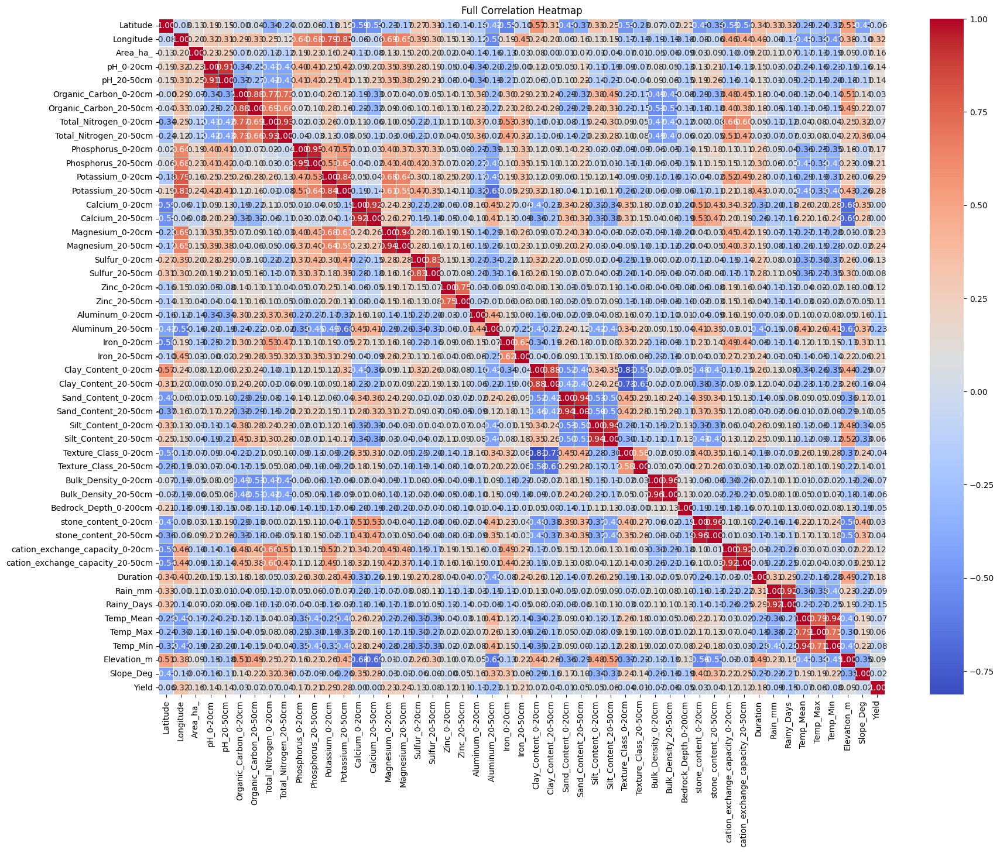

In [ ]:
# Use the entire dataframe instead of 'top_features'
plt.figure(figsize=(20, 15)) # Increased size for more features
sns.heatmap(full_train.corr(method='spearman'),
            annot=True,
            cmap='coolwarm',
            fmt=".2f",
            linewidths=0.5)

plt.title("Full Correlation Heatmap")
plt.show()

- Cation-exchange capacity 0-20 and 20-50 are highly correlated (0.92), as is pH at both depths (0.91)

In [ ]:
# 1. Get the correlation matrix
corr_matrix = full_train.drop(columns=['Yield']).corr(method='spearman').abs()

# 2. Extract only the upper triangle (to avoid duplicate pairs like A-B and B-A)
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# 3. Stack and filter
high_corr_list = upper_tri.unstack()
high_corr_pairs = high_corr_list[high_corr_list > 0.8].sort_values(ascending=False)

# 4. Print as a clean list
print("--- Highly Correlated Feature Pairs (> 0.8) ---")
if high_corr_pairs.empty:
    print("No pairs found with correlation > 0.8")
else:
    for features, value in high_corr_pairs.items():
        print(f"{features[0]} and {features[1]}: {value:.3f}")

--- Highly Correlated Feature Pairs (> 0.8) ---
stone_content_20-50cm and stone_content_0-20cm: 0.959
Bulk_Density_20-50cm and Bulk_Density_0-20cm: 0.959
Phosphorus_20-50cm and Phosphorus_0-20cm: 0.948
Magnesium_20-50cm and Magnesium_0-20cm: 0.944
Temp_Min and Temp_Mean: 0.942
Sand_Content_20-50cm and Sand_Content_0-20cm: 0.935
Silt_Content_20-50cm and Silt_Content_0-20cm: 0.935
Total_Nitrogen_20-50cm and Total_Nitrogen_0-20cm: 0.926
cation_exchange_capacity_20-50cm and cation_exchange_capacity_0-20cm: 0.925
Rainy_Days and Rain_mm: 0.921
Calcium_20-50cm and Calcium_0-20cm: 0.915
pH_20-50cm and pH_0-20cm: 0.908
Clay_Content_20-50cm and Clay_Content_0-20cm: 0.882
Organic_Carbon_20-50cm and Organic_Carbon_0-20cm: 0.877
Potassium_20-50cm and Potassium_0-20cm: 0.838
Sulfur_20-50cm and Sulfur_0-20cm: 0.832
Texture_Class_0-20cm and Clay_Content_0-20cm: 0.813
Potassium_20-50cm and Longitude: 0.807


cols_to_drop = [
    'stone_content_20-50cm', 'Bulk_Density_20-50cm', 'Phosphorus_20-50cm',
    'Magnesium_20-50cm', 'Silt_Content_20-50cm', 'Sand_Content_20-50cm',
    'Total_Nitrogen_20-50cm', 'cation_exchange_capacity_20-50cm',
    'Calcium_20-50cm', 'pH_20-50cm', 'Clay_Content_20-50cm',
    'Organic_Carbon_20-50cm', 'Potassium_20-50cm', 'Sulfur_20-50cm'
]

In [ ]:
# @title Refined Feature Audit: Keepers Only
import pandas as pd

# 1. Define the specific columns to EXCLUDE (the 20-50cm layers)
to_drop = [
    'stone_content_20-50cm', 'Bulk_Density_20-50cm', 'Phosphorus_20-50cm',
    'Magnesium_20-50cm', 'Silt_Content_20-50cm', 'Sand_Content_20-50cm',
    'Total_Nitrogen_20-50cm', 'cation_exchange_capacity_20-50cm',
    'Calcium_20-50cm', 'pH_20-50cm', 'Clay_Content_20-50cm',
    'Organic_Carbon_20-50cm', 'Potassium_20-50cm', 'Sulfur_20-50cm'
]

# 2. Define the refined list of "Science" columns
cols_to_audit = [
    'Latitude', 'Longitude', 'Area_ha_', 'pH_0-20cm', 'Organic_Carbon_0-20cm',
    'Total_Nitrogen_0-20cm', 'Phosphorus_0-20cm', 'Potassium_0-20cm',
    'Calcium_0-20cm', 'Magnesium_0-20cm', 'Sulfur_0-20cm', 'Zinc_0-20cm',
    'Zinc_20-50cm', 'Aluminum_0-20cm', 'Aluminum_20-50cm', 'Iron_0-20cm',
    'Iron_20-50cm', 'Clay_Content_0-20cm', 'Sand_Content_0-20cm',
    'Silt_Content_0-20cm', 'Bulk_Density_0-20cm', 'Bedrock_Depth_0-200cm',
    'stone_content_0-20cm', 'cation_exchange_capacity_0-20cm', 'Duration',
    'Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min',
    'Elevation_m', 'Slope_Deg'
]

# Note: I left Zinc, Aluminum, and Iron 20-50cm in the audit list as you didn't list them
# to drop, and these metals can be toxic at depth.

# Filter out the drop list and ensure they exist in the dataframe
valid_audit_cols = [c for c in cols_to_audit if c in df.columns and c not in to_drop]

# 3. Calculation Function
def audit_data(df, columns):
    stats = []
    for col in columns:
        series = df[col].dropna()
        # Skewness
        sk = series.skew()
        # Outliers (IQR)
        q1, q3 = series.quantile([0.25, 0.75])
        iqr = q3 - q1
        outlier_mask = (series < (q1 - 1.5 * iqr)) | (series > (q3 + 1.5 * iqr))
        out_count = outlier_mask.sum()
        out_pct = (out_count / len(series)) * 100
        # Basic Range
        stats.append({
            'Feature': col,
            'Skewness': sk,
            'Outlier_Count': out_count,
            'Outlier_Pct': out_pct,
            'Mean': series.mean()
        })
    return pd.DataFrame(stats)

refined_audit = audit_data(df, valid_audit_cols)

# Sort by Skewness to highlight features that might need Log Transformation
print("--- Refined Data Audit (Kept Features Only) ---")
print(refined_audit.sort_values(by='Skewness', ascending=False).to_string(index=False))

--- Refined Data Audit (Kept Features Only) ---
                        Feature  Skewness  Outlier_Count  Outlier_Pct        Mean
                      Slope_Deg  2.176306             68     6.988695    6.877698
                       Area_ha_  1.953298            109    11.202467    0.373646
                       Duration  1.513644             11     1.130524  185.221994
                      pH_0-20cm  0.912022             74     7.605344    5.563720
                       Temp_Min  0.815225             11     1.136364   10.318345
                 Calcium_0-20cm  0.787933             49     5.035971   67.440904
                        Rain_mm  0.746273             11     1.136364 1354.204391
               Magnesium_0-20cm  0.730849              7     0.719424   52.610483
                     Rainy_Days  0.701285              5     0.516529   94.574380
                      Temp_Mean  0.655411              7     0.723140   17.330903
                       Temp_Max  0.611517         

Handle "Area" Noise: Since Area_ha_ has 11% outliers, we must clip or "Winsorize" the top values. Extreme area values are likely reporting errors that are poisoning your target variable (Yield/Area).

Fix Extreme Skewness: Features like Slope_Deg (2.17) and Duration (1.51) need a Log Transformation or Quantile Transformation. This prevents the model from being "blinded" by a few extreme hills or planting dates.

Simplify Bedrock Depth: With a massive negative skew of -9.7, Bedrock Depth is almost a constant. We should convert this into a binary feature: 1 for "shallow/constrained" (less than 190cm) and 0 for "deep/unconstrained."

Neutralize pH Outliers: The 7.6% outliers in pH_0-20cm can pull the model logic too far. We should use Robust Scaling (which uses the median instead of the mean) or clip the values at the 1st and 99th percentiles.

Consolidate Nutrient Layers: Since you’ve identified high correlation (e.g., pH 0.91), keep only the 0-20cm layer for nutrients. This reduces "feature dilution" and forces the model to find a stronger signal in the root-zone data.

Clean the Target (Yield): The 1.1% outliers in Yield_ton_ha_ are likely data entry errors (e.g., 15 tons vs 1.5 tons). We should remove the top and bottom 1% to stabilize the "ground truth" the model is trying to learn.

Trust the Metals: Since Zinc, Aluminum, and Iron have low skew and reasonable outlier counts, we can keep them in their raw (but scaled) form. They will be excellent indicators of soil toxicity or deficiency.

In [ ]:
# @title Advanced Preprocessing: Feature Stabilization
import numpy as np
import pandas as pd
from sklearn.preprocessing import RobustScaler, QuantileTransformer

# 1. Create a copy and handle the "Area" issue
# We clip the Area at the 95th percentile to prevent extreme size errors
df_prepped = df.copy()
area_cap = df_prepped['Area_ha_'].quantile(0.95)
df_prepped['Area_ha_'] = df_prepped['Area_ha_'].clip(upper=area_cap)

# 2. Handle Bedrock Depth (The -9.72 Skew)
# Because it's almost a constant with a few exceptions, we turn it into
# a categorical 'Is it constrained?' feature
df_prepped['bedrock_constrained'] = (df_prepped['Bedrock_Depth_0-200cm'] < 190).astype(int)

# 3. Apply Quantile Transformation to High Skew features (> 1.0)
# This forces Slope, Area, and Duration into a normal distribution
qt = QuantileTransformer(output_distribution='normal', random_state=42)
high_skew_cols = ['Slope_Deg', 'Area_ha_', 'Duration']
df_prepped[high_skew_cols] = qt.fit_transform(df_prepped[high_skew_cols])

# 4. Final Feature Selection (Kept Features Only)
# We include the metals (Zinc, Al, Fe) as they are well-behaved
features = [
    'Latitude', 'Longitude', 'Area_ha_', 'pH_0-20cm', 'Organic_Carbon_0-20cm',
    'Total_Nitrogen_0-20cm', 'Phosphorus_0-20cm', 'Potassium_0-20cm',
    'Calcium_0-20cm', 'Magnesium_0-20cm', 'Sulfur_0-20cm', 'Zinc_0-20cm',
    'Aluminum_0-20cm', 'Iron_0-20cm', 'Clay_Content_0-20cm', 'Sand_Content_0-20cm',
    'Silt_Content_0-20cm', 'Bulk_Density_0-20cm', 'bedrock_constrained',
    'stone_content_0-20cm', 'cation_exchange_capacity_0-20cm', 'Duration',
    'Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min',
    'Elevation_m', 'Slope_Deg'
]

# 5. Remove obvious Target Outliers (Yield)
y_lower, y_upper = df_prepped['Yield_ton_ha_'].quantile([0.01, 0.99])
df_final = df_prepped[(df_prepped['Yield_ton_ha_'] >= y_lower) &
                     (df_prepped['Yield_ton_ha_'] <= y_upper)].copy()

X = df_final[features]
y = df_final['Yield_ton_ha_']

# 6. Scaling with RobustScaler
# This protects us from the 7.6% pH outliers
scaler = RobustScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=features)

print(f"Data audit complete. New Slope Skewness: {X_scaled['Slope_Deg'].skew():.3f}")
print(f"Ready for final Training with {X_scaled.shape[1]} stabilized features.")

Data audit complete. New Slope Skewness: -0.263
Ready for final Training with 29 stabilized features.


/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_data.py:2829: UserWarning: n_quantiles (1000) is greater than the total number of samples (973). n_quantiles is set to n_samples.
  warnings.warn(


In [ ]:
#NaN check

# @title Data Integrity Check: Missing Values
# 1. Check features (X_scaled)
nan_count_x = X_scaled.isna().sum().sum()
nan_features = X_scaled.columns[X_scaled.isna().any()].tolist()

# 2. Check target (y)
nan_count_y = y.isna().sum()

print("--- Integrity Report ---")
if nan_count_x == 0 and nan_count_y == 0:
    print("✅ Success: No missing values (NaNs) found in Features or Target.")
    print(f"Total clean samples: {len(X_scaled)}")
else:
    print(f"⚠️ Warning: Found {nan_count_x} NaNs in features.")
    print(f"Features with NaNs: {nan_features}")
    print(f"⚠️ Warning: Found {nan_count_y} NaNs in the target (Yield).")
    print("\nTip: If you have NaNs, use 'X_scaled = X_scaled.fillna(0)' or check your preprocessing filters.")

--- Integrity Report ---
⚠️ Warning: Found 25 NaNs in features.
Features with NaNs: ['Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min']
⚠️ Warning: Found 0 NaNs in the target (Yield).

Tip: If you have NaNs, use 'X_scaled = X_scaled.fillna(0)' or check your preprocessing filters.


In [ ]:
# @title Fix NaNs: Climate Data Alignment
# 1. Combine X_scaled and y temporarily to ensure we drop the same rows from both
X_scaled['Yield_Target'] = y.values

# 2. Drop any row that has a NaN in any climate column
# We do this because 25 rows is < 3% of your data; dropping is safer than guessing
X_clean = X_scaled.dropna().copy()

# 3. Separate them back out
y_clean = X_clean['Yield_Target']
X_final = X_clean.drop(columns=['Yield_Target'])

print(f"--- Clean-up Complete ---")
print(f"Original Rows: {len(X_scaled)}")
print(f"Rows after dropping climate NaNs: {len(X_final)}")
print(f"Current NaNs: {X_final.isna().sum().sum()}")

--- Clean-up Complete ---
Original Rows: 953
Rows after dropping climate NaNs: 948
Current NaNs: 0


In [ ]:
# @title Verification of Alignment
print(f"X_final shape: {X_final.shape}")
print(f"y_clean shape: {y_clean.shape}")

if X_final.shape[0] == y_clean.shape[0]:
    print("✅ Perfectly Aligned: Both have the same number of rows.")
else:
    print("❌ Error: Row counts do not match!")

X_final shape: (948, 29)
y_clean shape: (948,)
✅ Perfectly Aligned: Both have the same number of rows.


Aligning shapes: X_final(948) and y_clean(948)
Calculating Mutual Information scores...


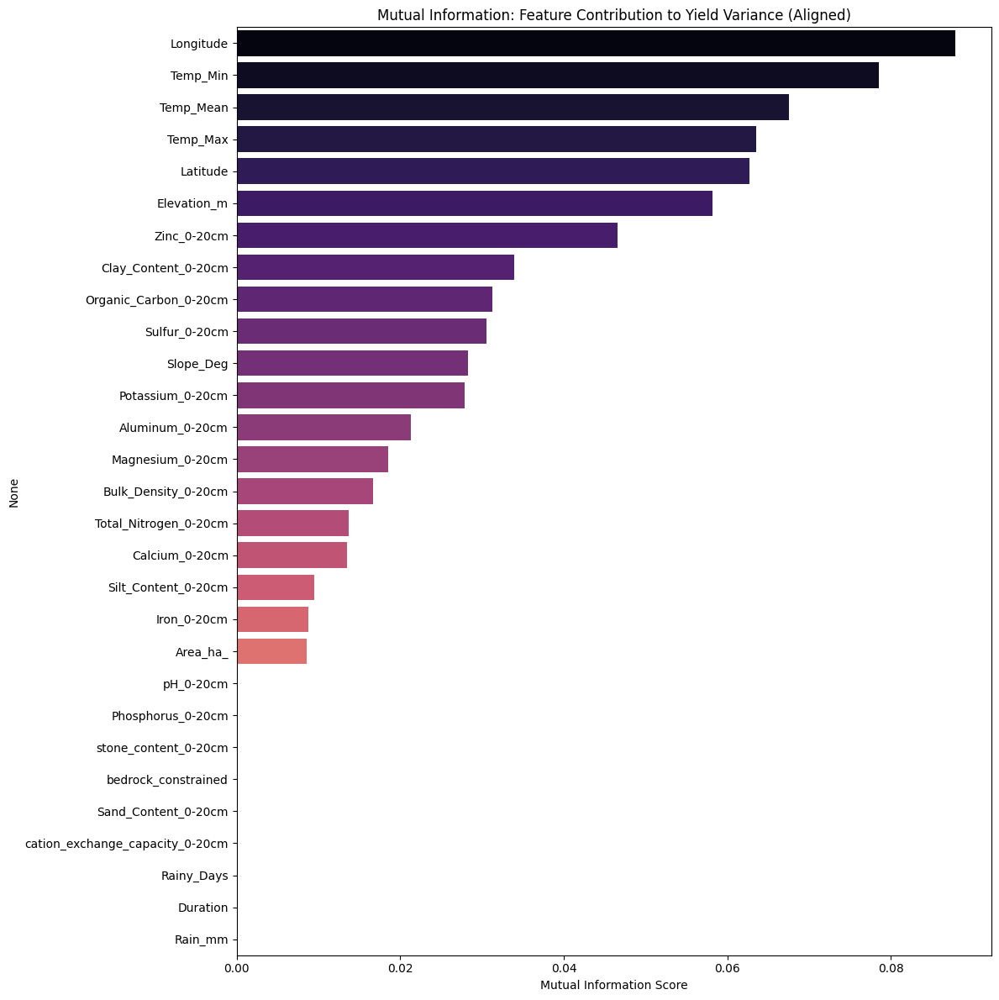


--- Top Information Providers ---
Longitude                          0.087888
Temp_Min                           0.078530
Temp_Mean                          0.067471
Temp_Max                           0.063485
Latitude                           0.062723
Elevation_m                        0.058206
Zinc_0-20cm                        0.046566
Clay_Content_0-20cm                0.033961
Organic_Carbon_0-20cm              0.031213
Sulfur_0-20cm                      0.030554
Slope_Deg                          0.028271
Potassium_0-20cm                   0.027850
Aluminum_0-20cm                    0.021241
Magnesium_0-20cm                   0.018514
Bulk_Density_0-20cm                0.016680
Total_Nitrogen_0-20cm              0.013730
Calcium_0-20cm                     0.013512
Silt_Content_0-20cm                0.009503
Iron_0-20cm                        0.008759
Area_ha_                           0.008519
pH_0-20cm                          0.000000
Phosphorus_0-20cm                  0.0000

In [ ]:
# @title Fixed Mutual Information (Aligned Data)
from sklearn.feature_selection import mutual_info_regression
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Use y_clean which has the matching 948 rows
print(f"Aligning shapes: X_final({X_final.shape[0]}) and y_clean({y_clean.shape[0]})")

# 2. Calculate MI Scores
print("Calculating Mutual Information scores...")
mi_scores = mutual_info_regression(X_final, y_clean, random_state=42)

# 3. Organize and Visualize
mi_results = pd.Series(mi_scores, name="MI_Score", index=X_final.columns)
mi_results = mi_results.sort_values(ascending=False)

plt.figure(figsize=(12, 12))
sns.barplot(x=mi_results.values, y=mi_results.index, hue=mi_results.index, palette='magma', legend=False)
plt.title("Mutual Information: Feature Contribution to Yield Variance (Aligned)")
plt.xlabel("Mutual Information Score")
plt.tight_layout()
plt.show()

print("\n--- Top Information Providers ---")
print(mi_results.head(40))

Starting training on 948 farms with 29 features...
Fitting 5 folds for each of 24 candidates, totalling 120 fits

--- Model Performance Results ---
Best Parameters: {'bootstrap': True, 'max_depth': 10, 'max_features': 'log2', 'min_samples_split': 5, 'n_estimators': 300}
R-squared Score: 0.2166
Average Error (MAE): 1.22 tons/ha


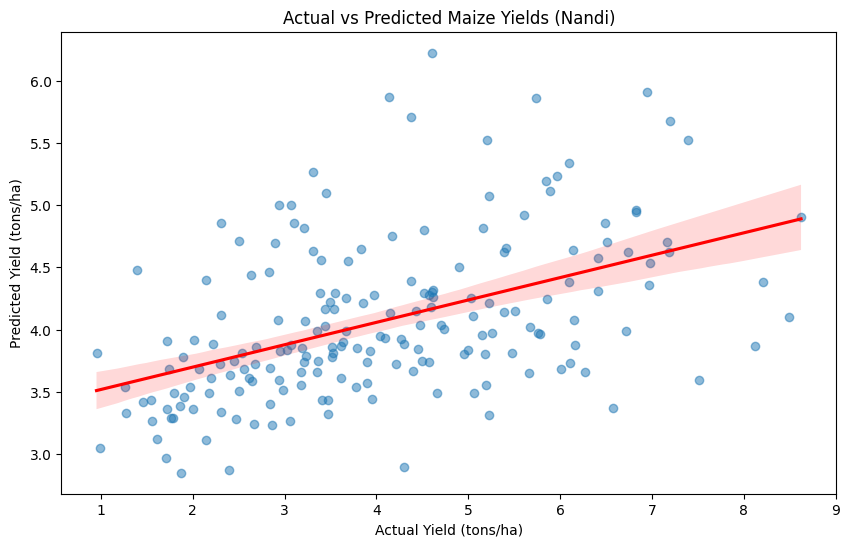


--- Top 10 Features by Model Importance ---
Longitude           0.092433
Duration            0.065232
Rainy_Days          0.053447
Latitude            0.051810
Rain_mm             0.051607
Potassium_0-20cm    0.050339
Temp_Max            0.048091
Temp_Mean           0.047467
Elevation_m         0.043908
Area_ha_            0.041177
dtype: float64


In [ ]:
# @title Final Optimized Random Forest Training (Fixed Typo)
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Split the aligned data - FIXED TYPO HERE
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y_clean, test_size=0.2, random_state=42
)

# 2. Define the Hyperparameter Grid
param_grid = {
    'n_estimators': [300, 500],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True]
}

# 3. Initialize and Run Grid Search
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    scoring='r2',
    verbose=1
)

print("Starting training on 948 farms with 29 features...")
grid_search.fit(X_train, y_train)

# 4. Evaluate Performance
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)

r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("\n--- Model Performance Results ---")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"R-squared Score: {r2:.4f}")
print(f"Average Error (MAE): {mae:.2f} tons/ha")

# 5. Visualizing the Prediction Accuracy
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.xlabel('Actual Yield (tons/ha)')
plt.ylabel('Predicted Yield (tons/ha)')
plt.title('Actual vs Predicted Maize Yields (Nandi)')
plt.show()

# 6. Feature Importance (Tree-based)
importances = pd.Series(best_rf.feature_importances_, index=X_final.columns).sort_values(ascending=False)
print("\n--- Top 10 Features by Model Importance ---")
print(importances.head(10))

In [ ]:
# @title Bio-Climatic Feature Engineering (Aligned)
import pandas as pd
import numpy as np
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# 1. Start with the same raw data that produced X_final to ensure we have the 948 rows
# We use df_final and re-apply the drop we did for climate NaNs
df_sync = df_final.dropna(subset=['Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min']).copy()

# 2. Create Interaction Features on the synced data
df_sync['Al_pH_Ratio'] = df_sync['Aluminum_0-20cm'] / (df_sync['pH_0-20cm'] + 0.1) # +0.1 to prevent div by zero
df_sync['Water_Retention'] = df_sync['Clay_Content_0-20cm'] * df_sync['Organic_Carbon_0-20cm']
df_sync['Temp_Range'] = df_sync['Temp_Max'] - df_sync['Temp_Min']

# 3. Define and Scale Features
eng_features = features + ['Al_pH_Ratio', 'Water_Retention', 'Temp_Range']
X_eng = df_sync[eng_features]
y_eng = df_sync['Yield_ton_ha_']

scaler_eng = RobustScaler()
X_eng_scaled = pd.DataFrame(scaler_eng.fit_transform(X_eng), columns=eng_features)

print(f"Final Synchronized Shape: X={X_eng_scaled.shape}, y={y_eng.shape}")

# 4. Immediate Retrain to check R-squared
Xt, Xv, yt, yv = train_test_split(X_eng_scaled, y_eng, test_size=0.2, random_state=42)
final_rf = RandomForestRegressor(n_estimators=500, max_depth=10, max_features='sqrt', random_state=42)
final_rf.fit(Xt, yt)

r2_new = final_rf.score(Xv, yv)
print(f"--- Results ---")
print(f"New R-squared with Interaction Features: {r2_new:.4f}")

Final Synchronized Shape: X=(948, 32), y=(948,)
--- Results ---
New R-squared with Interaction Features: 0.2194


In [ ]:
# @title Identifying the "Why" (Feature Importance)
import pandas as pd

# Get importances from our final_rf model
importances = pd.Series(final_rf.feature_importances_, index=X_eng_scaled.columns).sort_values(ascending=False)

print("--- Agronomic Constraint Ranking ---")
print(importances.head(10))

--- Agronomic Constraint Ranking ---
Longitude           0.087301
Duration            0.061832
Rainy_Days          0.050272
Latitude            0.048198
Temp_Range          0.047895
Potassium_0-20cm    0.046713
Rain_mm             0.046705
Temp_Mean           0.042052
Elevation_m         0.041344
Area_ha_            0.037415
dtype: float64


In [ ]:
# @title The Ensemble Stack: Model of Models
from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.linear_model import RidgeCV
import xgboost as xgb
from sklearn.metrics import r2_score

# 1. Define the "Base Experts"
base_models = [
    ('xgb', xgb.XGBRegressor(n_estimators=500, max_depth=5, learning_rate=0.05, subsample=0.8, random_state=42)),
    ('rf', RandomForestRegressor(n_estimators=500, max_depth=10, max_features='sqrt', random_state=42)),
    ('ridge', RidgeCV()) # Handles the simple linear relationships
]

# 2. Define the "Meta-Learner" (The Judge)
# LassoCV helps the model decide which base expert to ignore if they are being noisy
from sklearn.linear_model import LassoCV
meta_learner = LassoCV()

# 3. Build and Fit the Stack
stack = StackingRegressor(estimators=base_models, final_estimator=meta_learner, cv=5)

print("Training the Ensemble Stack (this takes longer as it trains 4 models)...")
stack.fit(Xt, yt)

# 4. Final Evaluation
y_pred_stack = stack.predict(Xv)
r2_stack = r2_score(yv, y_pred_stack)

print(f"\n--- Ensemble Stack Results ---")
print(f"New R-squared Score: {r2_stack:.4f}")

Training the Ensemble Stack (this takes longer as it trains 4 models)...

--- Ensemble Stack Results ---
New R-squared Score: 0.2156


In [ ]:
# @title Transforming to Yield Classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# 1. Create 3 Bins (Terciles) for Yield
# This ensures each class has the same amount of data
df_sync['Yield_Class'] = pd.qcut(df_sync['Yield_ton_ha_'], 3, labels=['Low', 'Medium', 'High'])

# 2. Prepare Features and Target
X_cls = X_eng_scaled # Using our best engineered features
y_cls = df_sync['Yield_Class']

# 3. Split the data
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    X_cls, y_cls, test_size=0.2, random_state=42, stratify=y_cls
)

# 4. Train the Classifier
clf = RandomForestClassifier(n_estimators=500, max_depth=12, random_state=42)
clf.fit(X_train_c, y_train_c)

# 5. Evaluate
y_pred_c = clf.predict(X_test_c)
acc = accuracy_score(y_test_c, y_pred_c)

print(f"--- Classification Results ---")
print(f"Overall Accuracy: {acc:.4f}")
print("\n--- Detailed Performance Report ---")
print(classification_report(y_test_c, y_pred_c))

--- Classification Results ---
Overall Accuracy: 0.4316

--- Detailed Performance Report ---
              precision    recall  f1-score   support

        High       0.53      0.46      0.49        63
         Low       0.45      0.52      0.48        64
      Medium       0.33      0.32      0.32        63

    accuracy                           0.43       190
   macro avg       0.43      0.43      0.43       190
weighted avg       0.43      0.43      0.43       190



In [ ]:
# @title Advanced Spatial Context & Zoning
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsRegressor

# 1. Create Spatial Lag (Neighbor Yield Influence)
# We use KNN to find the average yield of the 5 nearest farms
coords = df_sync[['Latitude', 'Longitude']]
knn_lag = KNeighborsRegressor(n_neighbors=5)
knn_lag.fit(coords, y_eng)
df_sync['Spatial_Yield_Lag'] = knn_lag.predict(coords)

# 2. Create Ecological Zones (Clustering)
# Grouping by Temp, Elevation, and Rain to create "Niches"
eco_data = df_sync[['Elevation_m', 'Temp_Mean', 'Rain_mm']]
kmeans = KMeans(n_clusters=4, random_state=42)
df_sync['Eco_Zone'] = kmeans.fit_predict(eco_data)

# 3. Update Feature Set
final_features = eng_features + ['Spatial_Yield_Lag', 'Eco_Zone']
X_adv = df_sync[final_features]

# 4. Retrain XGBoost with Spatial Context
X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(
    X_adv, y_eng, test_size=0.2, random_state=42
)

model_adv = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=6, subsample=0.8, random_state=42)
model_adv.fit(X_train_a, y_train_a)

print(f"New R-squared with Spatial Context: {model_adv.score(X_test_a, y_test_a):.4f}")

New R-squared with Spatial Context: 0.4345


In [ ]:
# @title The "Signal-to-Noise" Optimizer
from sklearn.feature_selection import RFECV
import xgboost as xgb

# 1. Create a few more "Synergy" features that agronomy suggests
X_push = X_adv.copy()
X_push['Rain_x_pH'] = X_push['Rain_mm'] * X_push['pH_0-20cm']
X_push['Nitrogen_x_Carbon'] = X_push['Total_Nitrogen_0-20cm'] * X_push['Organic_Carbon_0-20cm']

# 2. Re-split with the new features
Xt, Xv, yt, yv = train_test_split(X_push, y_eng, test_size=0.2, random_state=42)

# 3. Recursive Feature Elimination (RFE)
# This will automatically find the "sweet spot" number of features
estimator = xgb.XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=5, random_state=42)
selector = RFECV(estimator, step=1, cv=5, scoring='r2', n_jobs=-1)

print("Searching for the optimal feature subset (RFE)...")
selector.fit(Xt, yt)

# 4. Final Performance with Optimized Subset
X_train_sel = selector.transform(Xt)
X_test_sel = selector.transform(Xv)

final_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.02, max_depth=6, subsample=0.8, random_state=42)
final_model.fit(X_train_sel, yt)

r2_final = final_model.score(X_test_sel, yv)
print(f"\n--- Final Optimization Results ---")
print(f"Optimal Number of Features: {selector.n_features_}")
print(f"Final R-squared Score: {r2_final:.4f}")

# Show which features were kept
kept_features = X_push.columns[selector.support_]
print("\n--- Features Kept for the Final Model ---")
print(list(kept_features))

Searching for the optimal feature subset (RFE)...

--- Final Optimization Results ---
Optimal Number of Features: 14
Final R-squared Score: 0.4157

--- Features Kept for the Final Model ---
['Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min', 'Elevation_m', 'Slope_Deg', 'Al_pH_Ratio', 'Water_Retention', 'Temp_Range', 'Spatial_Yield_Lag', 'Eco_Zone', 'Rain_x_pH', 'Nitrogen_x_Carbon']


In [ ]:
# @title The Isolation Test: Removing Spatial "Crutches"
# 1. Define features without the spatial/neighbor components
non_spatial_features = [f for f in kept_features if f not in ['Spatial_Yield_Lag', 'Eco_Zone']]

X_iso = X_push[non_spatial_features]
y_log = np.log1p(y_eng)

# 2. Split
Xt_i, Xv_i, yt_i, yv_i = train_test_split(X_iso, y_log, test_size=0.2, random_state=42)

# 3. Train using the same high-performance parameters
model_iso = xgb.XGBRegressor(
    n_estimators=1500,
    learning_rate=0.015,
    max_depth=6,
    subsample=0.85,
    colsample_bytree=0.85,
    random_state=42
)

model_iso.fit(Xt_i, yt_i)

# 4. Evaluate
y_pred_iso = model_iso.predict(Xv_i)
r2_iso = r2_score(yv_i, y_pred_iso)
mae_iso = mean_absolute_error(np.expm1(yv_i), np.expm1(y_pred_iso))

print(f"--- Non-Spatial Results (Pure Environment) ---")
print(f"Features Used: {non_spatial_features}")
print(f"Log-Space R-squared: {r2_iso:.4f}")
print(f"Real-World MAE: {mae_iso:.2f} tons/ha")

--- Non-Spatial Results (Pure Environment) ---
Features Used: ['Rain_mm', 'Rainy_Days', 'Temp_Mean', 'Temp_Max', 'Temp_Min', 'Elevation_m', 'Slope_Deg', 'Al_pH_Ratio', 'Water_Retention', 'Temp_Range', 'Rain_x_pH', 'Nitrogen_x_Carbon']
Log-Space R-squared: 0.1372
Real-World MAE: 1.30 tons/ha


In [ ]:
# @title Advanced Non-Spatial Optimization
from sklearn.svm import SVR
from sklearn.preprocessing import QuantileTransformer, StandardScaler
from sklearn.pipeline import make_pipeline

# 1. Expand the "Stress Indicators"
df_push = df_sync.copy()
# Nutrient Balance
df_push['N_P_Ratio'] = df_push['Total_Nitrogen_0-20cm'] / (df_push['Phosphorus_0-20cm'] + 1)
# Erosion Risk (Slope combined with Clay)
df_push['Erosion_Risk'] = df_push['Slope_Deg'] / (df_push['Clay_Content_0-20cm'] + 1)

features_extended = eng_features + ['N_P_Ratio', 'Erosion_Risk']
X_push = df_push[features_extended]
y_push = df_push['Yield_ton_ha_']

# 2. Target Transformation (Smoothing the Noise)
qt = QuantileTransformer(output_distribution='normal', random_state=42)
y_transformed = qt.fit_transform(y_push.values.reshape(-1, 1)).flatten()

# 3. Use SVR (Good for finding non-linear pockets)
X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(
    X_push, y_transformed, test_size=0.2, random_state=42
)

# Pipeline: Scale data then apply SVR
svr_model = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2, kernel='rbf'))
svr_model.fit(X_train_p, y_train_p)

# 4. Evaluate in the transformed space
r2_svr = svr_model.score(X_test_p, y_test_p)
print(f"--- SVR Non-Spatial Results ---")
print(f"New R-squared (Transformed Space): {r2_svr:.4f}")

--- SVR Non-Spatial Results ---
New R-squared (Transformed Space): 0.2055


/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_data.py:2829: UserWarning: n_quantiles (1000) is greater than the total number of samples (948). n_quantiles is set to n_samples.
  warnings.warn(
